# Business Problem

1. Customer segmentation: How can we **segment customers**, into different clusters, so as to **deliver tailored marketing strategies**, so as to **minimise promotional costs/retain loyal customers/raise revenue**?
2. Product Recommendation: How can we also **make personalised product recommendations**, so as to **raise revenue**?
3. Continued customer engagement: How can we FURTHER **engage customers through email/promotion campaigns**, so as to **raise revenue**?

I answer all these below, and culminate all these work into:

For 1. a Dashboard to view customer segments and see relevant marketing strategies for each segment, https://public.tableau.com/profile/lim.yu.zheng#!/vizhome/UCI-retail-recommenderMarketing-Dashboard/Story1?publish=yes

For 2. a Webapp to serve the recommendations (can also incoporate Market Basket Analysis recommendations from 3.), https://uci-retail-recommender.herokuapp.com/

For 3. an Email Marketing Campaign (via Heroku's 'Sendgrid Marketing Campaign' add-on) to send mass emails, complete with A/B testing and analytics 

In [1]:
import datetime as dt
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
from sklearn.preprocessing import StandardScaler
# from wordcloud import WordCloud
# from nltk.stem.snowball import SnowballStemmer
# from nltk.tokenize import RegexpTokenizer
# from nltk.corpus import stopwords
import pickle

# 1. Customer Segmentation

### 1.1 EDA, data cleaning, Feature engineering

In [2]:
data = pd.read_csv('../dataset/Online_Retail.csv') #for 500k rows, date only going back to 2010
# data = pd.read_csv('../dataset/Online_Retail_II.csv',sep='\t') #for 1m rows, date going back to even 2009
data.head()

,InvoiceNo,StockCode,Description,Quantity,InvoiceDate,UnitPrice,CustomerID,Country
0,536365,85123A,WHITE HANGING HEART T-LIGHT HOLDER,6,1/12/2010 8:26,2.55,17850.0,United Kingdom
1,536365,71053,WHITE METAL LANTERN,6,1/12/2010 8:26,3.39,17850.0,United Kingdom
2,536365,84406B,CREAM CUPID HEARTS COAT HANGER,8,1/12/2010 8:26,2.75,17850.0,United Kingdom
3,536365,84029G,KNITTED UNION FLAG HOT WATER BOTTLE,6,1/12/2010 8:26,3.39,17850.0,United Kingdom
4,536365,84029E,RED WOOLLY HOTTIE WHITE HEART.,6,1/12/2010 8:26,3.39,17850.0,United Kingdom


In [3]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 541909 entries, 0 to 541908
Data columns (total 8 columns):
InvoiceNo      541909 non-null object
StockCode      541909 non-null object
Description    540455 non-null object
Quantity       541909 non-null int64
InvoiceDate    541909 non-null object
UnitPrice      541909 non-null float64
CustomerID     406829 non-null float64
Country        541909 non-null object
dtypes: float64(2), int64(1), object(5)
memory usage: 33.1+ MB


Many CustomerIDs which are nulls, which is pointless as we won't be able to cluster those customers. So let's drop them. Also, CustomerID can be integer. Also convert InvoiceDate to datetime. Also create cols for year, month.

In [4]:
data = data[data.CustomerID.notnull()]
data.CustomerID = data.CustomerID.astype(int) #keep as integer for convenience in recomendation engine later
data.InvoiceDate = pd.to_datetime(data.InvoiceDate)
data['Year'] = pd.DatetimeIndex(data['InvoiceDate']).year
data['Month'] = pd.DatetimeIndex(data['InvoiceDate']).month
data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 406829 entries, 0 to 541908
Data columns (total 10 columns):
InvoiceNo      406829 non-null object
StockCode      406829 non-null object
Description    406829 non-null object
Quantity       406829 non-null int64
InvoiceDate    406829 non-null datetime64[ns]
UnitPrice      406829 non-null float64
CustomerID     406829 non-null int32
Country        406829 non-null object
Year           406829 non-null int64
Month          406829 non-null int64
dtypes: datetime64[ns](1), float64(1), int32(1), int64(3), object(4)
memory usage: 32.6+ MB


In [5]:
print('Unique dates:',data.InvoiceDate.unique())
print('Min date:',data.InvoiceDate.min())
print('Max date:',data.InvoiceDate.max())

Unique dates: ['2010-01-12T08:26:00.000000000' '2010-01-12T08:28:00.000000000'
 '2010-01-12T08:34:00.000000000' ... '2011-09-12T12:31:00.000000000'
 '2011-09-12T12:49:00.000000000' '2011-09-12T12:50:00.000000000']
Min date: 2010-01-12 08:26:00
Max date: 2011-12-10 17:19:00


In [6]:
data.head()

,InvoiceNo,StockCode,Description,Quantity,InvoiceDate,UnitPrice,CustomerID,Country,Year,Month
0,536365,85123A,WHITE HANGING HEART T-LIGHT HOLDER,6,2010-01-12 08:26:00,2.55,17850,United Kingdom,2010,1
1,536365,71053,WHITE METAL LANTERN,6,2010-01-12 08:26:00,3.39,17850,United Kingdom,2010,1
2,536365,84406B,CREAM CUPID HEARTS COAT HANGER,8,2010-01-12 08:26:00,2.75,17850,United Kingdom,2010,1
3,536365,84029G,KNITTED UNION FLAG HOT WATER BOTTLE,6,2010-01-12 08:26:00,3.39,17850,United Kingdom,2010,1
4,536365,84029E,RED WOOLLY HOTTIE WHITE HEART.,6,2010-01-12 08:26:00,3.39,17850,United Kingdom,2010,1


Good! No nulls now. CustomerIDs have been coverted to integers, invoice dates coverted to datetime, and we see that dates span from 12 Jan 2010 to 10 Dec 2011. Now let's further explore the data.

Let's check for duplicated rows.

In [7]:
data[data.duplicated(subset=None, keep=False)] #checks for duplicates across ALL columns

#very many duplicated rows. Gotta delete duplicates

,InvoiceNo,StockCode,Description,Quantity,InvoiceDate,UnitPrice,CustomerID,Country,Year,Month
485,536409,22111,SCOTTIE DOG HOT WATER BOTTLE,1,2010-01-12 11:45:00,4.95,17908,United Kingdom,2010,1
489,536409,22866,HAND WARMER SCOTTY DOG DESIGN,1,2010-01-12 11:45:00,2.10,17908,United Kingdom,2010,1
494,536409,21866,UNION JACK FLAG LUGGAGE TAG,1,2010-01-12 11:45:00,1.25,17908,United Kingdom,2010,1
517,536409,21866,UNION JACK FLAG LUGGAGE TAG,1,2010-01-12 11:45:00,1.25,17908,United Kingdom,2010,1
521,536409,22900,SET 2 TEA TOWELS I LOVE LONDON,1,2010-01-12 11:45:00,2.95,17908,United Kingdom,2010,1
...,...,...,...,...,...,...,...,...,...,...
541675,581538,22068,BLACK PIRATE TREASURE CHEST,1,2011-09-12 11:34:00,0.39,14446,United Kingdom,2011,9
541689,581538,23318,BOX OF 6 MINI VINTAGE CRACKERS,1,2011-09-12 11:34:00,2.49,14446,United Kingdom,2011,9
541692,581538,22992,REVOLVER WOODEN RULER,1,2011-09-12 11:34:00,1.95,14446,United Kingdom,2011,9
541699,581538,22694,WICKER STAR,1,2011-09-12 11:34:00,2.10,14446,United Kingdom,2011,9


In [8]:
# lets drop duplicates now
data.drop_duplicates(subset=None, keep='first', inplace=True)

We also replace all (leading, trailing spaces, / " ' ,) with -, to enable the image scraping later ("google_image_scraper" notebook) to be more accurate.

In [9]:
data.Description = data.Description.str.lstrip() #strip leading spaces
data.Description = data.Description.str.rstrip() #strip trailing spaces
data.Description = data.Description.str.replace(' -','-')
data.Description = data.Description.str.replace('- ','-')
data.Description = data.Description.str.replace(' ','/')
data.Description = data.Description.str.replace('/','-')
data.Description = data.Description.str.replace('"','-')
data.Description = data.Description.str.replace('\'','-')
data.Description = data.Description.str.replace(',','-')
data.Description = data.Description.str.replace('+','&')

We notice there are some products which have the same Description, but different StockCodes. And vice versa. Let's consolidate identical products into the same Descriptions and StockCodes.

In [10]:
repeated_stockcodes = [x for x in data.groupby('Description')['StockCode'].unique() if len(x)>1]
print(repeated_stockcodes)

# hence, for each of these items, lets use the StockCode which is larger (we just need to have 1 common Stockcode)
for i in repeated_stockcodes:
    for j in i:
        if j!=i.max():
            data.StockCode.replace(to_replace=j, value=i.max(),inplace=True)
# very many products with same Description, but different StockCodes!

[array(['82580', '21171'], dtype=object), array(['10133', '10135'], dtype=object), array(['72133', '72131'], dtype=object), array(['72127', '72130', '72128'], dtype=object), array(['85023B', '85024B'], dtype=object), array(['20837', '20840'], dtype=object), array(['20835', '20838'], dtype=object), array(['20839', '20836'], dtype=object), array(['79403', '79406'], dtype=object), array(['21814', '85118'], dtype=object), array(['82613B', '82613C', '82613D', '82613A'], dtype=object), array(['23041', '23040'], dtype=object), array(['84905', '84906'], dtype=object), array(['47586A', '47585A'], dtype=object), array(['79329', '79331'], dtype=object), array(['35909B', '35910B'], dtype=object), array(['84712B', '84708B'], dtype=object), array(['79190A', '79192A'], dtype=object), array(['79190D', '79191D'], dtype=object), array(['79191B', '79190B'], dtype=object), array(['21003', '20997'], dtype=object), array(['81952B', '81953B'], dtype=object), array(['84509B', '84509G'], dtype=object), array([

In [11]:
repeated_descriptions = [x for x in data.groupby('StockCode')['Description'].unique() if len(x)>1]
print(repeated_descriptions)

# hence, for each of these items, lets use the Description which is longer (we just need to have 1 common Description)
for i in repeated_descriptions:
    for j in i:
        if j!=i.max():
            data.Description.replace(to_replace=j, value=i.max(),inplace=True)    
# very many products with same StockCode, but different Descriptions!

[array(['WRAP--CAROUSEL', 'WRAP-CAROUSEL'], dtype=object), array(['FLOWER-FAIRY-5-SUMMER-B-DRAW-LINERS',
       'FLOWER-FAIRY-5-DRAWER-LINERS',
       'FLOWER-FAIRY-5-SUMMER-DRAW-LINERS'], dtype=object), array(['VIPPASSPORT-COVER', 'VIP-PASSPORT-COVER'], dtype=object), array(['LUNCH-BAG-RED-RETROSPOT', 'LUNCH-BAG-RED-SPOTTY'], dtype=object), array(['SET-5-RED-RETROSPOT-LID-GLASS-BOWLS',
       'SET-5-RED-SPOTTY-LID-GLASS-BOWLS'], dtype=object), array(['LARGE-CAKE-TOWEL--CHOCOLATE-SPOTS',
       'LARGE-CAKE-TOWEL-CHOCOLATE-SPOTS'], dtype=object), array(['SWISS-ROLL-TOWEL--PINK--SPOTS', 'SWISS-ROLL-TOWEL-PINK--SPOTS'],
      dtype=object), array(['GIN-&-TONIC-DIET-METAL-SIGN', 'GIN-AND-TONIC-DIET-METAL-SIGN'],
      dtype=object), array(['STRAWBERRY-CERAMIC-TRINKET-BOX', 'STRAWBERRY-CERAMIC-TRINKET-POT'],
      dtype=object), array(['PINK--POLKADOT-PLATE', 'PINK-POLKADOT-PLATE'], dtype=object), array(['ELEPHANT--BIRTHDAY-CARD-', 'ELEPHANT-BIRTHDAY-CARD'], dtype=object), array(['CHRISTMAS

In [12]:
# check that there are no more repeated StockCodes for the same Description, and vice versa
print([x for x in data.groupby('Description')['StockCode'].unique() if len(x)>1])
print([x for x in data.groupby('StockCode')['Description'].unique() if len(x)>1])

[]
[]


Good! No more duplicates.

Now lets see the distribution of all quantitative data.

In [13]:
data.describe() #there seems to be 0 values for Unit Price, and negative values for qty

,Quantity,UnitPrice,CustomerID,Year,Month
count,401604.000000,401604.000000,401604.000000,401604.000000,401604.000000
mean,12.183273,3.474064,15281.160818,2010.934378,6.941350
std,250.283037,69.764035,1714.006089,0.247620,3.328531
min,-80995.000000,0.000000,12346.000000,2010.000000,1.000000
25%,2.000000,1.250000,13939.000000,2011.000000,4.000000
50%,5.000000,1.950000,15145.000000,2011.000000,7.000000
75%,12.000000,3.750000,16784.000000,2011.000000,10.000000
max,80995.000000,38970.000000,18287.000000,2011.000000,12.000000


In [14]:
# $0 unit prices?

print(data[data.UnitPrice==0].shape)
data[data.UnitPrice==0].head() #rather peculiar, but not much we can do

(40, 10)


,InvoiceNo,StockCode,Description,Quantity,InvoiceDate,UnitPrice,CustomerID,Country,Year,Month
9302,537197,22841,ROUND-CAKE-TIN-VINTAGE-GREEN,1,2010-05-12 14:02:00,0.0,12647,Germany,2010,5
33576,539263,22580,ADVENT-CALENDAR-GINGHAM-SACK,4,2010-12-16 14:36:00,0.0,16560,United Kingdom,2010,12
40089,539722,22423,REGENCY-CAKESTAND-3-TIER,10,2010-12-21 13:45:00,0.0,14911,EIRE,2010,12
47068,540372,22090,PAPER-BUNTING-RETROSPOT,24,2011-06-01 16:41:00,0.0,13081,United Kingdom,2011,6
47070,540372,22553,PLASTERS-IN-TIN-SKULLS,24,2011-06-01 16:41:00,0.0,13081,United Kingdom,2011,6


In [15]:
# -ve quantities?

print(data[data.Quantity<0].shape)
data[data.Quantity<0].head() 

(8872, 10)


,InvoiceNo,StockCode,Description,Quantity,InvoiceDate,UnitPrice,CustomerID,Country,Year,Month
141,C536379,D,Discount,-1,2010-01-12 09:41:00,27.50,14527,United Kingdom,2010,1
154,C536383,35004C,SET-OF-3-COLOURED--FLYING-DUCKS,-1,2010-01-12 09:49:00,4.65,15311,United Kingdom,2010,1
235,C536391,22556,PLASTERS-IN-TIN-CIRCUS-PARADE,-12,2010-01-12 10:24:00,1.65,17548,United Kingdom,2010,1
236,C536391,21984,PACK-OF-12-PINK-PAISLEY-TISSUES,-24,2010-01-12 10:24:00,0.29,17548,United Kingdom,2010,1
237,C536391,21983,PACK-OF-12-BLUE-PAISLEY-TISSUES,-24,2010-01-12 10:24:00,0.29,17548,United Kingdom,2010,1


Even though Quantity may be negative, customers may have bought a sum total of 0, positive, or negative number of a particular good. Lets see...

In [16]:
data.groupby(['CustomerID', 'StockCode'])['Quantity'].sum().sort_values()

CustomerID  StockCode
15838       84347        -9360
18133       M            -1350
15749       47566B       -1300
16422       D             -723
12908       M             -600
                         ...  
16333       21915         8120
16422       17003        10077
16333       84077        10080
17949       22197        11692
13256       84826        12540
Name: Quantity, Length: 267349, dtype: int64

We will remove the rows which have -ve sum total for Quantity, as they are not indicative of the actual amount of Quantity purchased (they may have had positive Quantities of that item's purchase in the time period before this dataset. But we don't have that info, hence the "-ve sum total" data is useless to us).

In [17]:
data['CustomerID_StockCode'] = data['CustomerID'].map(str) + data['StockCode'].map(str) #concat C.ID and StockCode
data_grouped = pd.DataFrame(data.groupby(['CustomerID_StockCode'])['Quantity'].sum())
data = pd.merge(data,data_grouped[data_grouped.Quantity>0],how='inner',on='CustomerID_StockCode')

# 2 quantity cols emerge. Quantity_x is qty bought by the customer in that invoice. Quantity_y is the sum total by
# the same customer, for his purchases of that particular product.
data = data.rename(columns={"Quantity_x": "Quantity", "Quantity_y": "Quantity_sum_CustomerID_StockCode"})
data.head()

,InvoiceNo,StockCode,Description,Quantity,InvoiceDate,UnitPrice,CustomerID,Country,Year,Month,CustomerID_StockCode,Quantity_sum_CustomerID_StockCode
0,536365,85123A,WHITE-HANGING-HEART-T-LIGHT-HOLDER,6,2010-01-12 08:26:00,2.55,17850,United Kingdom,2010,1,1785085123A,122
1,536373,85123A,WHITE-HANGING-HEART-T-LIGHT-HOLDER,6,2010-01-12 09:02:00,2.55,17850,United Kingdom,2010,1,1785085123A,122
2,536375,85123A,WHITE-HANGING-HEART-T-LIGHT-HOLDER,6,2010-01-12 09:32:00,2.55,17850,United Kingdom,2010,1,1785085123A,122
3,536396,85123A,WHITE-HANGING-HEART-T-LIGHT-HOLDER,6,2010-01-12 10:51:00,2.55,17850,United Kingdom,2010,1,1785085123A,122
4,536406,85123A,WHITE-HANGING-HEART-T-LIGHT-HOLDER,8,2010-01-12 11:33:00,2.55,17850,United Kingdom,2010,1,1785085123A,122


In [18]:
data.groupby(['CustomerID', 'StockCode'])['Quantity'].sum().sort_values()

CustomerID  StockCode
17883       22495            1
18041       22910            1
16445       23301            1
            23202            1
17602       22660            1
                         ...  
16333       21915         8120
16422       17003        10077
16333       84077        10080
17949       22197        11692
13256       84826        12540
Name: Quantity, Length: 264942, dtype: int64

Indeed we only have sum-positive purchase quantities now.

We will also add a column for total price for each transaction.

In [19]:
data['TotalPrice'] = data.UnitPrice * data.Quantity
data.head(1)

,InvoiceNo,StockCode,Description,Quantity,InvoiceDate,UnitPrice,CustomerID,Country,Year,Month,CustomerID_StockCode,Quantity_sum_CustomerID_StockCode,TotalPrice
0,536365,85123A,WHITE-HANGING-HEART-T-LIGHT-HOLDER,6,2010-01-12 08:26:00,2.55,17850,United Kingdom,2010,1,1785085123A,122,15.3


This column would help us later when we do Recency-Frequency-Monetary customer segmentation.

After all that cleaning above, now lets see the number of unique transactions etc.

In [20]:
print('no. of unique transactions:',len(data.InvoiceNo.unique()))
print('no. of unique items:',len(data.StockCode.unique()))
print('no. of unique Countries bought from:',len(data.Country.unique()))
print('no. of unique customers:',len(data.CustomerID.unique()))
print('no. of unique years:',len(data.Year.unique()))
print('no. of unique months:',len(data.Month.unique()))

no. of unique transactions: 21235
no. of unique items: 3620
no. of unique Countries bought from: 37
no. of unique customers: 4326
no. of unique years: 2
no. of unique months: 12


Let's see the distribution of countries, where purchases were made.

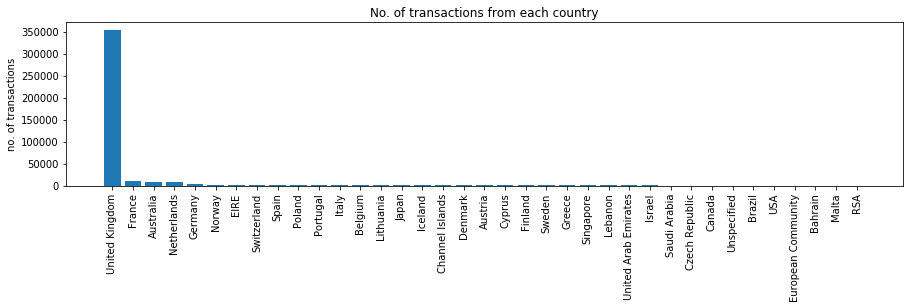

In [401]:
plt.figure(figsize=(15,3))
plt.bar(data.Country.unique(),data.Country.value_counts())
plt.ylabel('no. of transactions')
plt.title('No. of transactions from each country')
plt.xticks(rotation=90);

Mostly from UK.

Let's see the range of prices.

In [22]:
data.UnitPrice.describe()

count    397283.000000
mean          3.037391
std          10.939658
min           0.000000
25%           1.250000
50%           1.950000
75%           3.750000
max        2500.000000
Name: UnitPrice, dtype: float64

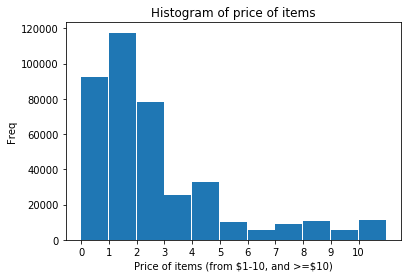

In [23]:
hist, bin_edges = np.histogram(data.UnitPrice, bins=[0,1,2,3,4,5,6,7,8,9,10,data.UnitPrice.max()])
fig, ax = plt.subplots()
ax.bar(bin_edges[:-1],hist, align='edge',width=0.97); #'edge' aligns xticks with left edge of bars
plt.xticks(bin_edges[:-1]); #include label for all numbers on x-axis
plt.title('Histogram of price of items');
plt.xlabel('Price of items (from \$1-10, and >=\$10)');
plt.ylabel('Freq');

Given 10 bins, we see that most items cost from \\$0-3, and very few cost >\\$10, with the max price at \\$38970. There are some prices which are \\$0, not much we can do about them. Let's see the distribution of dates.

In [407]:
print('Distribution of years for all transactions:')
print('\nabsolute numbers...\n',data.Year.value_counts())
print('\nnormalised...\n',data.Year.value_counts(normalize=True))

Distribution of years for all transactions:

absolute numbers...
 2011    371347
2010     25936
Name: Year, dtype: int64

normalised...
 2011    0.934717
2010    0.065283
Name: Year, dtype: float64


We see that very few (6.5%) of the dataset is from 2010, most are from 2011. Lets see the distribution of data in the dataset. 

Let's explore the common words in the description.

In [25]:
# # tokenize the words in the description
# tokenizer = RegexpTokenizer('\w+')  #only extract words, not punctuations
# words=[]

# for i in range(data.shape[0]):
#     tokens = tokenizer.tokenize(data.iloc[i].Description)

#     # remove stopwords, using nltk's list of stopwords (better than sklearn's CountVectorizer/TdifVectorizer's list)
#     stops = set(stopwords.words('english'))# In Python, searching a set is much faster than searching a list, so convert the stop words to a set.
#     tokens = [w for w in tokens if w not in stops]

#     # stemming
#     s_stemmer = SnowballStemmer('english')
#     tokens = [s_stemmer.stem(i) for i in tokens]
#     tokens = ' '.join(tokens)
#     words.append(tokens)
# words = ' '.join(words)

In [26]:
# # Create and generate a word cloud image:
# wordcloud = WordCloud(max_font_size=80, max_words=100,
#                        background_color="white",
#                      contour_width=5, contour_color='firebrick').generate(words)

# # Display the generated image:
# plt.imshow(wordcloud, interpolation='bilinear')
# plt.axis("off")
# plt.title('Frequency of words')
# plt.show()

### 1.2 Modelling & Evaluation: RFM + Unsupervised Clustering for customer segmentation

#### 1.2.1 RFM

There are many reasons for wanting to segment customers into different groupings, eg. save marketing/promotional/sales team costs on unpromising customers, spend more/give more discounts/targeted recommendations for promising ones. https://www.gianfagnamarketing.com/blog/2011/03/24/7-ways-to-improve-your-marketing-strategy-with-rfm-analysis/ . How to segment?

First, we will be doing Recency/Frequency/Monetary analysis. So let's create a new table, indexed by Customer ID, with a column for days since last purchased ('Recency'). Also add a column for frequency of purchases per customer ('Frequency'). Also add a column for total monetary value of purchases per customer ('Monetary').

We saw from earlier what was the last date in the dataset, let's add 1 day to it, and let it be the reference date 'today' from which we calculate how long ago the last transaction was.

In [27]:
now = data.InvoiceDate.max()+dt.timedelta(days=1)
now

Timestamp('2011-12-11 17:19:00')

Now let's create a new RFM table, which aggregates the recency/freq/monetary value of each customer's purchase.

In [28]:
rfm = data.groupby('CustomerID').agg({'InvoiceDate': lambda x: (now - x.max()).days, #gap btw now and most recent purchase of customer
                                          'InvoiceNo': lambda x: len(x), #no. of transactions of customer
                                          'TotalPrice': lambda x: x.sum()}) #combined monetary value of customer
rfm.rename(columns={'InvoiceDate':'recency','InvoiceNo':'frequency','TotalPrice':'monetary'},inplace=True)
rfm.head()

,recency,frequency,monetary
CustomerID,,,
12347,41,182,4310.00
12348,77,31,1797.24
12349,20,73,1757.55
12350,312,17,334.40
12352,74,89,1545.41


This means that eg. for CustomerID 12347, he bought most recently 41 days ago, has made 182 transactions thus far, and has spent $4310 in total across all his purchases.

For each column, we shall now bin these values into 4 bins split by quartiles, lest there are unecessarily many/unuseful categories (as advised here: https://www.optimove.com/resources/learning-center/rfm-segmentation), from 1 (best: most recent, most frequent, most spending) to 4 (worst: least recent, least frequent, least spending).

In [169]:
n_bins=4
rfm_bin = rfm.copy()
# use qcut, to split into quartiles
rfm_bin.recency = pd.qcut(rfm.recency, q=n_bins, labels=[1,2,3,4]) #smaller recency ranks higher (tier 1)
rfm_bin.frequency = pd.qcut(rfm.frequency, q=n_bins, labels=[4,3,2,1]) #larger freq ranks higher (tier 1)
rfm_bin.monetary = pd.qcut(rfm.monetary, q=n_bins, labels=[4,3,2,1]) #larger monetary ranks higher (tier 1)
rfm_bin['combined'] = rfm_bin[['recency', 'frequency','monetary']].astype(str).apply(lambda x: ''.join(x), axis=1)
rfm_bin.head(10)

,recency,frequency,monetary,combined
CustomerID,,,,
12347,2,1,1,211
12348,3,3,1,331
12349,1,2,1,121
12350,4,4,3,443
12352,3,2,2,322
12353,4,4,4,444
12354,4,2,2,422
12355,3,4,3,343
12356,2,2,1,221


Good! We now have our customers sorted into RFM tiers! Let's see how many groups there are, and how many customers there are per group.

No. of groups: 61


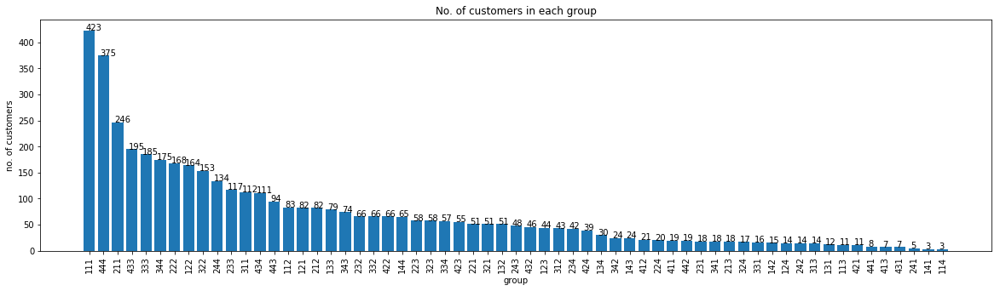

In [170]:
# value counts of each group
rfm_bin_valuecount = pd.DataFrame(rfm_bin[['recency', 'frequency','monetary']].astype(str).apply(lambda x: ''.join(x), axis=1).value_counts())
print('No. of groups:',len(rfm_bin_valuecount))

# barplot
plt.figure(figsize=(20,5))
plt.bar(rfm_bin_valuecount.index,rfm_bin_valuecount[0])
xlocs, xlabs = plt.xticks(rotation=90)
for i, v in enumerate(rfm_bin_valuecount[0]):  # Text on the top of each barplot
    plt.text(xlocs[i] - 0.25, v + 0.01, str(v))

plt.title('No. of customers in each group')
plt.xlabel('group')
plt.ylabel('no. of customers');

##### Downsides of this RFM grouping approach...

A problem here is that, since we split the R/F/M values into quartiles, we potentially have 4x4x4=64 groups to work with. As with the case here where we have 61 groups. That can be an unwieldily many groups to manage for the management team.

Another problem is that, customers at the edge of neighbouring tiers could actually be very close to each other (eg. customer A who spent \\$1000 was grouped into group 111, customer B who spent \\$990 was grouped into group 112. Or even 114 for that matter, if perhaps a huuuuge number of customers spent \\$991-999 and they took up the bulk of the 112/113 groups. This resultant grouping is bad, because Customer B should be considered a high spender and our marketing strategy should value him, yet the RFM grouping won't, because hes now in tier 4 for M). Customers A and B here should rightfully be in the same group, yet are "artificially" separated into different groups just because RFM splits them by quartiles.

Hence, could we try other methods of clustering customers together? Unsupervised clustering techniques, while maximising the silhouette score, can sort the customers (including outliers) into likely correct clusters. We also simplify into fewer clusters/groupings. RFM may work better thereafter. 

#### 1.2.2 Unsupervised Clustering (K-means and DB-Scan)

In [32]:
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
from sklearn.preprocessing import StandardScaler
from scipy.spatial.distance import cdist
from sklearn.cluster import DBSCAN

In [33]:
# Let's prepare our X matrix
X = rfm.loc[:,['recency','frequency','monetary']]
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X) #scale, lest outliers affect our algo (cos clustering depends on euclidean distance)
X_scaled.shape

(4326, 3)

Now lets try to determine the optimal number of clusters, via a few methods:

- kmeans with elbow method, evaluate with Distortion and Inertia
- kmeans, evaluate with silhouette score
- dbscan, evaluate with silhouette score. Use Gridsearch

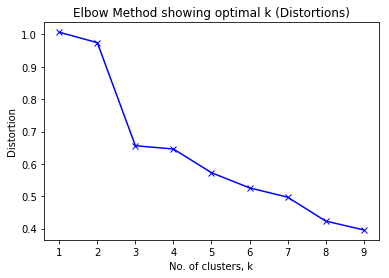

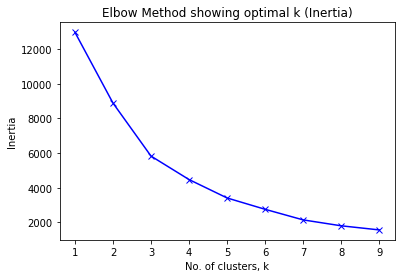

In [34]:
# kmeans with elbow method, evaluate with Distortion and Inertia

distortions, inertia = [],[]
K = range(1,10)
for k in K:
    km = KMeans(n_clusters=k, random_state=42, n_jobs=-1)
    km.fit(X_scaled)
    distortions.append(np.sum(np.min(cdist(X_scaled, km.cluster_centers_, 'euclidean'), axis=1)) / X_scaled.shape[0])
    inertia.append(km.inertia_)
    
# Plot the elbow, for distortions
plt.plot(K, distortions, 'bx-')
plt.xlabel('No. of clusters, k')
plt.ylabel('Distortion')
plt.title('Elbow Method showing optimal k (Distortions)')
plt.show()

# Plot the elbow, for inertia
plt.plot(K, inertia, 'bx-')
plt.xlabel('No. of clusters, k')
plt.ylabel('Inertia')
plt.title('Elbow Method showing optimal k (Inertia)')
plt.show()

To determine the optimal number of clusters, we have to select the value of k at the “elbow” ie the point after which the improvement in distortion declines the most. Or where the distortion/inertia starts decreasing in a linear fashion. Thus here, for k-means using the elbow method, the optimal number of clusters is 3 (one could say it could be 5 too, since another kink in the distortion happens again there). But honestly, 3 groups is arguably too few.

Distortion: average of the squared distances from the cluster centers of the respective clusters. Typically, the Euclidean distance metric is used.

Inertia: sum of squared distances of samples to their closest cluster center.

https://www.geeksforgeeks.org/elbow-method-for-optimal-value-of-k-in-kmeans/

https://scikit-learn.org/stable/modules/clustering.html

We try also to evaluate the optimal number of clusters with k-means, via the silhouette score (which actually considers both Distortion and Inertia as well).

In [35]:
# kmeans, evaluate with silhouette score

silhouette = [] #initialise empty list to store scores
K = range(1,10)
for k in K:
    km = KMeans(n_clusters=k, random_state=42, n_jobs=-1)
    km.fit(X_scaled)
    if k>2: #silhouette score cannot work if there's only 1 cluster. 
            #We should also exclude k=2 as its pointless to have just 2 groups
        silhouette.append(silhouette_score(X_scaled, km.labels_))
km = KMeans(n_clusters=np.argmax(silhouette)+3, random_state=42, n_jobs=-1) #initialise with the best param
km.fit(X_scaled) #fit with the best param

# print silhouette scores, show max
print('kmeans')
print('silhouette scores   :',silhouette)
print('max silhouette score:',max(silhouette))
print('no. of clusters for max silhouette score:',np.argmax(silhouette)+3)

kmeans
silhouette scores   : [0.5592277353003469, 0.5568250816694009, 0.5808685305042441, 0.5770038703170198, 0.567094415717584, 0.48542845997365264, 0.4931523813286049]
max silhouette score: 0.5808685305042441
no. of clusters for max silhouette score: 5


Let's also try to find the optimal number of clusters, via dbscan (so we don't have to self decide how many clusters to have). Also evaluate with silhouette score.

In [36]:
# dbscan, evaluate with silhouette score. Gridsearch (manually)

eps = [0.02,0.1,0.4] #maximum distance between two samples for one to be considered as in the neighborhood of the other
min_samples = [2,5,9] #number of samples (or total weight) in a neighborhood for a point to be considered as a core point
silhouette = [] #re-initialise empty list to store scores
for e in eps:
    for ms in min_samples:
        dbscan = DBSCAN(eps=e, min_samples=ms)
        dbscan.fit(X_scaled)
        silhouette.append(silhouette_score(X_scaled, dbscan.labels_))
silhouette = np.reshape(silhouette,(len(eps),len(min_samples))) #reshape into a 2d array, so later
                                                                #we can find the index of max silhouette score
best_params = [eps[np.where(silhouette == np.amax(silhouette))[0][0]], #best eps
              min_samples[np.where(silhouette == np.amax(silhouette))[1][0]]] #best min_samples
dbscan = DBSCAN(eps=best_params[0], min_samples=best_params[1]) #initialise with the best params
dbscan.fit(X_scaled) #fit with the best params

# print silhouette scores, show max
print('dbscan')
print('silhouette scores:',silhouette)
print('max silhouette score:',np.amax(silhouette))
print('best params for silhouette score:','eps=',best_params[0],
                                         'min_samples=',best_params[1])
print('clusters for max silhouette score:',pd.Series(dbscan.labels_).unique()) #cluster '-1' is noise
print('no. of clusters for max silhouette score:',len(pd.Series(dbscan.labels_).unique())-1)

dbscan
silhouette scores: [[-0.30538768 -0.48660662 -0.59448242]
 [-0.54104691 -0.26870997 -0.24849505]
 [ 0.48350691  0.58156653  0.61720142]]
max silhouette score: 0.6172014168565966
best params for silhouette score: eps= 0.4 min_samples= 9
clusters for max silhouette score: [ 0 -1  1  2]
no. of clusters for max silhouette score: 3


So, looking at all 3 methods, they seem to largely point towards k=3 or 5 as the optimum number of clusters. Lets visualise them.

##### Kmeans' results

We explore the clusters, by looking at the value counts & means of each cluster, and the pairplots. 

kmeans

no. of members per cluster:
0    3019
1    1062
4     236
2       5
3       4
Name: cluster, dtype: int64

median of RFM for each cluster:
cluster         0       1          2          3        4
recency     40.00  244.00       4.00      3.000    13.00
frequency   50.00   19.00     772.00   5456.000   417.00
monetary   808.87  304.92  189575.53  52530.255  6705.05

median of RFM for each cluster (R/F/M binned into 4 quartiles):
cluster    0  1  2  3  4
recency    3  4  1  1  2
frequency  4  4  2  1  3
monetary   4  4  1  2  3


C:\Users\Dell\Anaconda3\lib\site-packages\statsmodels\nonparametric\kde.py:487: RuntimeWarning: invalid value encountered in true_divide
  binned = fast_linbin(X, a, b, gridsize) / (delta * nobs)
C:\Users\Dell\Anaconda3\lib\site-packages\statsmodels\nonparametric\kdetools.py:34: RuntimeWarning: invalid value encountered in double_scalars
  FAC1 = 2*(np.pi*bw/RANGE)**2


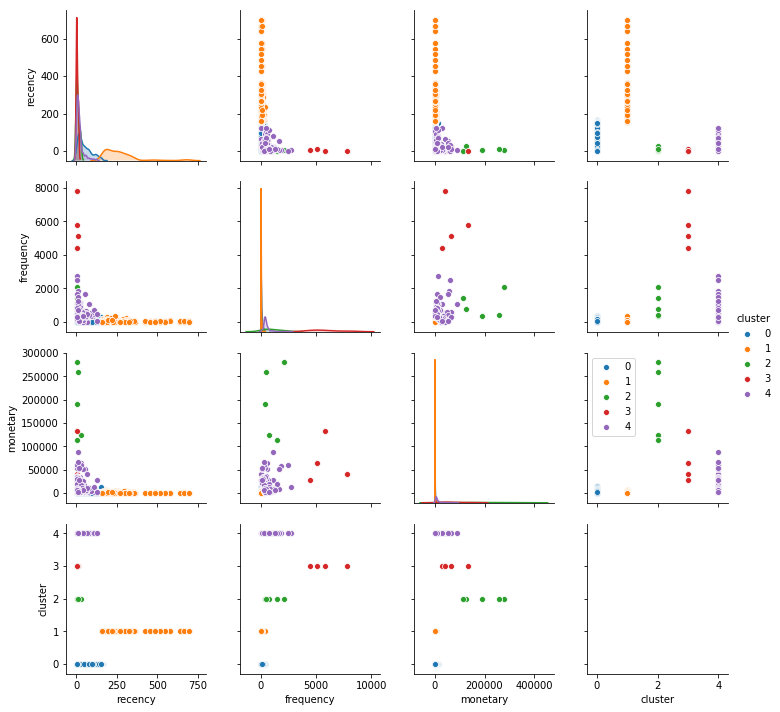

In [410]:
# for kmean's results

rfm_kmeans = rfm.copy()
rfm_kmeans['cluster'] = km.labels_ #append cluster labels as last column
print('kmeans')
print('\nno. of members per cluster:')
print(rfm_kmeans.cluster.value_counts())

# median of each cluster
print('\nmedian of RFM for each cluster:')
rfm_kmeans_median = rfm_kmeans.groupby('cluster').median() #median, to mitigate outlier effect
print(rfm_kmeans_median.T)  

# median of each cluster, binned into quartiles
rfm_kmeans_median_bin = rfm_kmeans_median.copy()
rfm_kmeans_median_bin.recency = pd.qcut(rfm_kmeans_median.recency, q=n_bins, labels=[1,2,3,4]) #smaller recency ranks higher (tier 1)
rfm_kmeans_median_bin.frequency = pd.qcut(rfm_kmeans_median.frequency, q=n_bins, labels=[4,3,2,1]) #larger freq ranks higher (tier 1)
rfm_kmeans_median_bin.monetary = pd.qcut(rfm_kmeans_median.monetary, q=n_bins, labels=[4,3,2,1]) #larger monetary ranks higher (tier 1)
print('\nmedian of RFM for each cluster (R/F/M binned into 4 quartiles):')
print(rfm_kmeans_median_bin.T)

# Pairplot
sns.pairplot(rfm_kmeans, hue='cluster'); #setting hue='cluster' sets different colors for different clusters
plt.legend();

From kmean's results, we can see that...

    - no '-1' class (count=0): noise
    - majority cluster 0 (count=3k): somewhat recent, least frequent, least monetary. Akin to RFM tier 3-4-4. Meh
    - cluster 1 (count=1k): least recent, least frequent, least monetary. Akin to RFM tier 4-4-4. Ditch them
    - cluster 2 (count=5): most recent, high frequency, highest monetary. Akin to RFM tier 1-2-1. Keep them,chase them
    - cluster 3 (count=4): most recent, most frequent, high monetary. Akin to RFM tier 1-1-2. Keep them,boost their spending
    - cluster 4 (count=~200): somewhat recent, low frequency, low monetary. Akin to RFM tier 2-3-3. Meh

##### Kmeans' customer-segmentation recommendations

Kmeans actually gave us clusters that match groupings and corresponding strategies used in industry ( https://www.barilliance.com/rfm-analysis/#tab-con-1 )! Some of the key customers to focus our attention on (and the corresponding marketing strategies) include the following groups, starting with the most important group:

A. Core - Your Best Customers (none from kmeans!)
    - RFM group: 111
    - Who They Are: Highly engaged customers who have bought the most recent, the most often, and generated the most revenue.
    - Marketing Strategies: Focus on loyalty programs and new product introductions. These customers have proven to have a higher willingness to pay, so don't use discount pricing to generate incremental sales. Instead, focus on value added offers through product recommendations based on previous purchases.

B. Loyal - Your Most Loyal Customers (kmeans cluster 3!)
    - RFM group: X1X
    - Who They Are: Customers who buy the most often from your store.
    - Marketing Strategies: Loyalty programs are effective for these repeat visitors. Advocacy programs and reviews are also common X1X strategies. Lastly, consider rewarding these customers with Free Shipping or other like benefits.

C. Whales - Your Highest Paying Customers (kmeans cluster 2!)
    - RFM group: XX1
    - Who They Are: Customers who have generated the most revenue for your store.
    - Marketing Strategies: These customers have demonstrated a high willingness to pay. Consider premium offers, subscription tiers, luxury products, or value add cross/up-sells. Don't waste margin on discounts. 


D. Promising - Faithful customers (none from kmeans!)
    - RFM group: X13, X14
    - Who They Are: Customers who return often, but do not spend a lot.
    - Marketing Strategies: You've already succeeded in creating loyalty. Focus on increasing monetization through product recommendations based on past purchases and incentives tied to spending thresholds (pegged to your store AOV). 

E. Rookies - Your Newest Customers (none from kmeans!)
    - RFM group: 14X
    - Who They Are: First time buyers on your site.
    - Marketing Strategies: Most customers never graduate to loyal. Having clear strategies in place for first time buyers such as triggered welcome emails will pay dividends.

F. Slipping - Once Loyal, Now Almost Gone (none from kmeans!)
    - RFM group: 44(1/2)
    - Who They Are: Great past customers who haven't bought in awhile.
    - Marketing Strategies: Customers leave for a variety of reasons. Depending on your situation price deals, new product launches, or other retention strategies.
    
G. Lost - Not worth keeping (kmeans cluster 0,1!)
    - RFM group: (3/4)44
    - Who They Are: Lost customers who spent little, infrequently
    - Marketing Strategies: Don't waste huge marketing efforts on them
    
H. Others - (kmeans cluster 4!)
    - RFM group: others
    - Who They Are: others
    - Marketing Strategies: No particular strategy. Maintain status quo

##### DB-Scan's results

dbscan

no. of members per cluster:
 0    4177
-1      73
 1      39
 2      37
Name: cluster, dtype: int64

median of RFM for each cluster:
cluster         -1       0       1       2
recency       13.0   58.00  486.00  667.00
frequency    588.0   41.00   12.00   12.00
monetary   21086.3  655.75  194.18  208.97

median of RFM for each cluster (R/F/M binned into 4 quartiles):
cluster   -1  0  1  2
recency    1  2  3  4
frequency  1  2  4  4
monetary   1  2  4  3


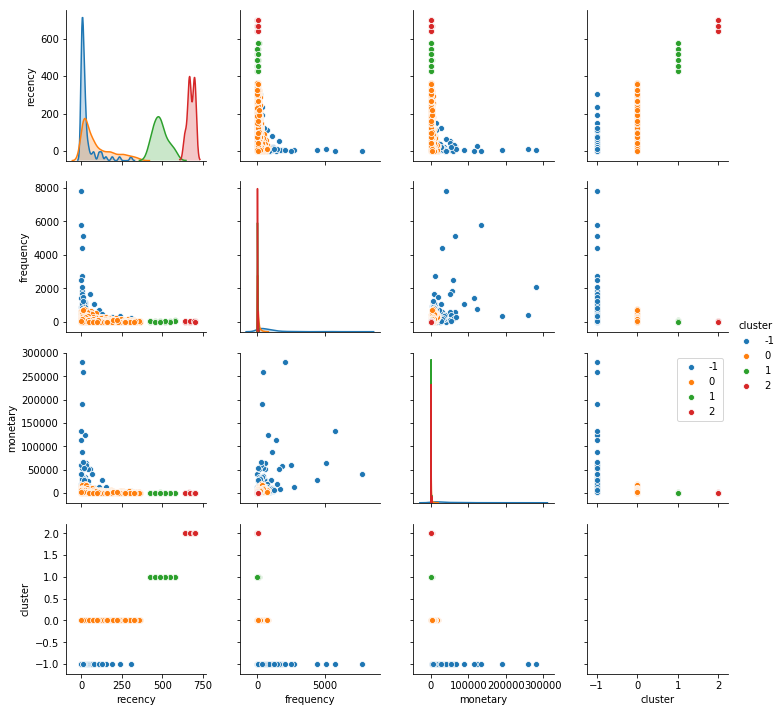

In [413]:
# for dbscan's results

rfm_dbscan = rfm.copy()
rfm_dbscan['cluster'] = dbscan.labels_ #append cluster labels as last column
print('dbscan')
print('\nno. of members per cluster:')
print(rfm_dbscan.cluster.value_counts())

# median of each cluster
print('\nmedian of RFM for each cluster:')
rfm_dbscan_median = rfm_dbscan.groupby('cluster').median() #median, to mitigate outlier effect
print(rfm_dbscan_median.T)  

# median of each cluster, binned into quartiles
rfm_dbscan_median_bin = rfm_dbscan_median.copy()
rfm_dbscan_median_bin.recency = pd.qcut(rfm_dbscan_median.recency, q=n_bins, labels=[1,2,3,4]) #smaller recency ranks higher (tier 1)
rfm_dbscan_median_bin.frequency = pd.qcut(rfm_dbscan_median.frequency, q=n_bins, labels=[4,2,1], duplicates='drop') #larger freq ranks higher (tier 1). 
# 'rfm_dbscan_median.frequency' has tier 3 dropped as the 0-50%tile all share the same bin edge
rfm_dbscan_median_bin.monetary = pd.qcut(rfm_dbscan_median.monetary, q=n_bins, labels=[4,3,2,1]) #larger monetary ranks higher (tier 1)
print('\nmedian of RFM for each cluster (R/F/M binned into 4 quartiles):')
print(rfm_dbscan_median_bin.T)

# Pairplot
sns.pairplot(rfm_dbscan, hue='cluster'); #setting hue='cluster' sets different colors for different clusters
plt.legend(); #notice that the -1 class, which although is noise, is the cluster that's key to us.

From dbscan's results, we can see that...

    - majority cluster 0 (count=4k): very recent, high freq, high monetary. Akin to RFM tier 2-2-2.
    - cluster -1 (count=~70): most recent, highest freq, highest monetary. not noise, but actually they're precisely whom we should target! Akin to RFM tier 1-1-1. Keep them
    - cluster 1 (count=~30): less recent, lowest freq, lowest monetary. Akin to RFM tier 3-4-4. Ditch them
    - cluster 2 (count=~30): least recent, lowest freq, low monetary. Akin to RFM tier 4-4-3. Ditch them?

##### DB-Scan' customer-segmentation recommendations

DB-Scan's clusters don't really match up with industries'. Can only give marketing recommendations, for 2 clusters (cluster -1 (RFM tier 111), cluster 1 (RFM tier 344). Lacking specific marketing recommendations for the other 2 clusters). But even for the supposed BEST group, cluster -1 (RFM 111), DB-Scan regarded them as noise, plus the cluster wrongly includes many infrequent, low-spending customers. So... lets ditch DB-Scan's customer-segmentation recommendations, and go with Kmeans instead.

### 1.3 Customer Segmentation conclusion

Moving ahead, we will segment our customers using Kmeans' recommended 5 clusters (which is a more manageable number of groups, and also clusters similar customer together. These circumvent the earlier 2 problems highlighted for RFM), and adopt targeted marketing strategies to each cluster, as stated above. This will help us to save cost, and also raise revenue.

We will merge the cluster labels, clusters' RFM labels, and add in the recommended marketing strategies for each cluster, to the original dataset, and save it as csv, to be used in a dashboard (https://public.tableau.com/profile/lim.yu.zheng#!/vizhome/UCI-retail-recommenderMarketing-Dashboard/Story1?publish=yes). 

In [416]:
# Sort CustomerID, StockCode by ascending order, label each with an id from 0 to max no. of customers/products. 

# Include _cat id, for ease of comparison of customers, with webapp, at the end of notebook 
data['CustomerID_cat'] = data['CustomerID'].astype("category").cat.codes 
data['StockCode_cat'] = data['StockCode'].astype("category").cat.codes

# include marketing strategies for each cluster, in dataframe
rfm_kmeans['strategy'] = ['''
B. Loyal - Your Most Loyal Customers (kmeans cluster 3!)

- RFM group: X1X
- Who They Are: Customers who buy the most often from your store.
- Marketing Strategies: Loyalty programs are effective for these repeat visitors. Advocacy programs and reviews are also common X1X strategies. Lastly, consider rewarding these customers with Free Shipping or other like benefits.
''' if x == 3 else '''
C. Whales - Your Highest Paying Customers (kmeans cluster 2!)

- RFM group: XX1
- Who They Are: Customers who have generated the most revenue for your store.
- Marketing Strategies: These customers have demonstrated a high willingness to pay. Consider premium offers, subscription tiers, luxury products, or value add cross/up-sells. Don't waste margin on discounts.
''' if x==2 else '''
G. Lost - Not worth keeping (kmeans cluster 0,1!)

- RFM group: (3/4)44
- Who They Are: Lost customers who spent little, infrequently
- Marketing Strategies: Don't waste huge marketing efforts on them
''' if x==0 else '''
G. Lost - Not worth keeping (kmeans cluster 0,1!)

- RFM group: (3/4)44
- Who They Are: Lost customers who spent little, infrequently
- Marketing Strategies: Don't waste huge marketing efforts on them
''' if x==1 else '''
H. Others - (kmeans cluster 4!)

- RFM group: others
- Who They Are: others
- Marketing Strategies: No particular strategy. Maintain status quo
''' for x in rfm_kmeans.cluster]

# merge
data_rfm_kmeansclusters = pd.merge(data,rfm_kmeans,on='CustomerID')
data_rfm_kmeansclusters.to_csv('../dataset/data_rfm_kmeansclusters.csv') #save as csv
data_rfm_kmeansclusters.head(2)

,InvoiceNo,StockCode,Description,Quantity,InvoiceDate,UnitPrice,CustomerID,Country,Year,Month,CustomerID_StockCode,Quantity_sum_CustomerID_StockCode,TotalPrice,CustomerID_cat,StockCode_cat,recency,frequency,monetary,cluster,strategy
0,536365,85123A,WHITE-HANGING-HEART-T-LIGHT-HOLDER,6,2010-01-12 08:26:00,2.55,17850,United Kingdom,2010,1,1785085123A,122,15.3,4006,3197,70,306,5312.94,0,\nG. Lost - Not worth keeping (kmeans cluster ...
1,536373,85123A,WHITE-HANGING-HEART-T-LIGHT-HOLDER,6,2010-01-12 09:02:00,2.55,17850,United Kingdom,2010,1,1785085123A,122,15.3,4006,3197,70,306,5312.94,0,\nG. Lost - Not worth keeping (kmeans cluster ...


# 2. Product Recommendation System

In recommendation systems, the Content Based Filtering technique (=explicit) is typically used if the products have already been classified into categories/genres. eg. Pandora's songs being (manually, laboriously) categorised into Pop, Folk etc genres. Since we don't have labelled genres of each product here, we cannot use Content Based Filtering.

There is also Collaborative Filtering (=implicit), where we recommend items based on similar users (who like similar items as you). Here, we will use their purchase quantities, convert that into binary (to indicate purchase intent), as that implicit rating from each user. 

We will use the fashion company Lyst's Lightfm  hybrid content-collaborative matrix factorisation algorithm, to represent users and items as linear combinations of their content features' latent factors. A simpler explanation is found here ( http://datameetsmedia.com/light-fm-recommendation-system-explained/ ). The model outperforms both collaborative and content-based models in cold-start or sparse interaction data scenarios (using both user and item metadata), and performs at least as well as a pure collaborative matrix factorisation model where interaction data is abundant.

Also see: https://arxiv.org/abs/1507.08439 , http://lyst.github.io/lightfm/docs/home.html

### 2.1 EDA, Feature engineering (cleaning already done in 1.1, Customer Segmentation section)

Before we begin, let's first look at the quantity purchased for each product, and the frequency at which they were purchased. There usually tends to be a long tail phenomenon, where only a few products enjoy a high number of interactions with customers.

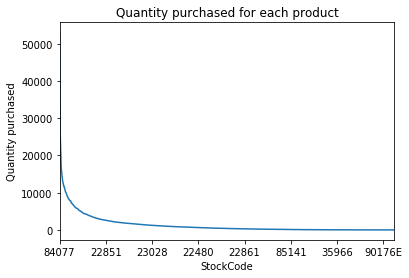

In [84]:
data.groupby('StockCode')['Quantity'].sum().sort_values(ascending=False).plot() #barplot would have taken ages to plot
plt.title('Quantity purchased for each product')
plt.ylabel('Quantity purchased');

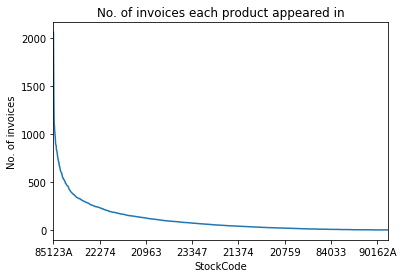

In [85]:
data.groupby('StockCode')['InvoiceNo'].count().sort_values(ascending=False).plot() #barplot would have taken ages to plot
plt.title('No. of invoices each product appeared in')
plt.ylabel('No. of invoices');

Indeed there is a long tail effect. Many products aren't purchased in sizeable quantities, nor frequently purchased.

Data has been cleaned prior. Let's first make a lookup table, which maps each product StockCode to its Description, for ease of reference later.

In [86]:
lookup = data.drop_duplicates(subset=['StockCode','Description'])
lookup = lookup[['StockCode','Description']]

# pickle this data for use in 'google_image_scraper' notebook later
with open('./webapp/static/pickle_files/lookup.pkl', 'wb') as file:
    pickle.dump(lookup, file)

lookup.head()

,StockCode,Description
0,85123A,WHITE-HANGING-HEART-T-LIGHT-HOLDER
17,71053,WHITE-MOROCCAN-METAL-LANTERN
34,84406B,CREAM-CUPID-HEARTS-COAT-HANGER
49,84029G,KNITTED-UNION-FLAG-HOT-WATER-BOTTLE
66,84029E,RED-WOOLLY-HOTTIE-WHITE-HEART.


Now, we create a df for usage later. For each customer, we need to group their purchases of the same items, together.

In [87]:
# important to sort CustomerID, StockCode in ascending order (numerical, alphabetical) for ease of finding later
# in recommendation engine
data_rec = data.groupby(['CustomerID','StockCode','Description','UnitPrice'])['Quantity'].sum().reset_index().sort_values(by=['CustomerID','StockCode'])
data_rec['CustomerID_cat'] = data_rec['CustomerID'].astype("category").cat.codes
data_rec['StockCode_cat'] = data_rec['StockCode'].astype("category").cat.codes

# pickle this data
with open('./webapp/static/pickle_files/data_rec.pkl', 'wb') as file:
    pickle.dump(data_rec, file)
    
data_rec.head(6)

,CustomerID,StockCode,Description,UnitPrice,Quantity,CustomerID_cat,StockCode_cat
0,12347,16008,SMALL-FOLDING-SCISSOR(POINTED-EDGE),0.25,24,0,24
1,12347,17021,NAMASTE-SWAGAT-INCENSE,0.30,36,0,86
2,12347,20665,RED-RETROSPOT-PURSE,2.95,6,0,129
3,12347,20719,WOODLAND-CHARLOTTE-BAG,0.85,40,0,165
4,12347,20780,BLACK-EAR-MUFF-HEADPHONES,4.65,12,0,204
5,12347,20782,CAMOUFLAGE-EAR-MUFF-HEADPHONES,5.49,6,0,206


We will also create a sparse matrix for usage later, to store every customers' non-zero purchase quantities, in a compact manner.

In [88]:
import scipy.sparse as sparse

customers = list(data_rec.CustomerID.unique()) #unique list of customers
products = list(data_rec.StockCode.unique())   #unique list of products
quantity = list(data_rec.Quantity)             #ALL purchased quantity values for every customer-product interaction

# create sparse matrix
purchases = sparse.csr_matrix((data_rec.Quantity.astype(float), (data_rec['CustomerID_cat'], data_rec['StockCode_cat'] )))
print(purchases.shape)

(4326, 3620)


From this sparse matrix, we convert all purchase quantities, to binary (1 for bought some quantity, 0 for nil purchase), as the LightFM models require binarized matrices as seen in the paper ( https://arxiv.org/pdf/1507.08439.pdf , section 4.1).

In [89]:
purchases_test = purchases.copy() #create a copy of the original sparse matrix, for binarized set
purchases_test[purchases_test != 0] = 1 #replace all purchase quantities with 1, to indicate purchase action. 
                                        #We are recognizing the sheer act of purchasing, not the volume of purchase

### 2.2 Modelling & Evaluation : Lightfm's hybrid content-collaborative matrix factorisation

Now, on to modelling and evaluation. There are many metrics used to score how well a recommendation engine works. Let's use the precision@k, recall@k, AUC scores (How precision@k, recall@k are calculated: http://sdsawtelle.github.io/blog/output/mean-average-precision-MAP-for-recommender-systems.html#Precision-and-Recall-of-a-Binary-Classifier ), all available within the Lightfm library. Since Lightfm's functions return individual scores as a list for each customer, for each metric we will take the mean score, across all users, hence yielding mean p@k, mean r@k, mean AUC. 

4 loss functions (or training methodologies) are available within the Lightfm library (https://lyst.github.io/lightfm/docs/lightfm.html):

    - logistic: useful when both positive (1) and negative (-1) interactions are present.
    - BPR: Bayesian Personalised Ranking [1] pairwise loss. Maximises the prediction difference between a positive example and a randomly chosen negative example. Useful when only positive interactions are present and optimising ROC AUC is desired.
    - WARP: Weighted Approximate-Rank Pairwise [2] loss. Maximises the rank of positive examples by repeatedly sampling negative examples until rank violating one is found. Useful when only positive interactions are present and optimising the top of the recommendation list (precision@k) is desired.
    - k-OS WARP: k-th order statistic loss [3]. A modification of WARP that uses the k-th positive example for any given user as a basis for pairwise updates.
    
Since our (sparse) matrix only has 1s and 0s (no negative interactions), hence we cannot use 'logistic'. We can use only BPR, WARP, or k-OS WARP. 

For the baseline score, we simply seek to achieve maximum AUC, which simply tries to ensure the overall ranking (for whichever number of products we wish to recommend) is by and large correct, without regard for recommending the top-k recommendations accurately. AUC score definition from Lightfm library is given as: 

    "AUC measures the quality of the overall ranking. In the binary case, it can be interpreted as the probability that a randomly chosen positive item is ranked higher than a randomly chosen negative item. Consequently, an AUC close to 1.0 will suggest that, by and large, your ordering is correct: and this can be true even if none of the first K items are positives. This metric may be more appropriate if you do not exert full control on which results will be presented to the user; it may be that the first K recommended items are not available any more (say, they are out of stock), and you need to move further down the ranking. A high AUC score will then give you confidence that your ranking is of high quality throughout."
(https://stackoverflow.com/questions/45451161/evaluating-the-lightfm-recommendation-model)

However, AUC is insufficient. p@k (and to a lesser extent r@k) are actually more important, because when online/shopping, customers, having short attention spans, won't waste so much time browsing through less relevant products. We seek to position relevant items at top of page,  to best ensure their purchase. Hence we seek to exceed the baseline score given by AUC, by maximising p@k and r@k. '@k' means that relevant recommendations in the top k recommendations matters, and irrelevant recommendations will pull down your score. So, 

    1. Primarily we seek to maximise precision@k (precision is TruePos/[TruePos+FalsePos]), because we want our model to predict (with correct ranking) as many relevant recommendations out of the limited number of recommendations we can fit on the page, considering short attention spans of customers. 
    2. Secondly, we also seek to  maximise recall@k (recall is TruePos/[TruePos+FalseNeg]), so that we don't miss out on potential revenue to be made.

(Relevant products vs recommended products: https://medium.com/@m_n_malaeb/recall-and-precision-at-k-for-recommender-systems-618483226c54 )

In [90]:
from lightfm import LightFM
from lightfm.evaluation import precision_at_k, recall_at_k, auc_score

Let's first create a function as we will be fitting and scoring multiple times, with different models.

In [91]:
def lightfm_fit_score(sparse_interactions_matrix,loss,no_components,epochs,
                      first_k,num_threads,learning_schedule='adagrad',verbose=False):
    
    # lightfm takes in these arguments...
    # LightFM(no_components=10, k=5, n=10, learning_schedule=’adagrad’, loss=’logistic’, learning_rate=0.05, 
    #         rho=0.95, epsilon=1e-06, item_alpha=0.0, user_alpha=0.0, max_sampled=10, random_state=None)
    model = LightFM(learning_schedule=learning_schedule, loss=loss,no_components=no_components) #no_components = latent no. of features in matrix factorization
    model.fit(interactions=sparse_interactions_matrix, 
                  num_threads=num_threads, #no. of cores to run parallely on. Must not exceed no. of cores! my computer has 4 cores
                  epochs=epochs, 
                  verbose=verbose) #True to print out progress  
    first_k = first_k #top k recommendations

    # each of the following metrics, gives a score for EACN & EVERY user, hence we take mean to get avg score of all users 
    # https://stackoverflow.com/questions/45451161/evaluating-the-lightfm-recommendation-model

    mean_p_at_k = precision_at_k(model, sparse_interactions_matrix, num_threads =num_threads, k=first_k).mean()
    print(f"mean precision@{first_k}: %.2f" % mean_p_at_k)

    mean_r_at_k = recall_at_k(model, sparse_interactions_matrix, num_threads =num_threads, k=first_k).mean()
    print(f"mean recall@{first_k}: %.2f" % mean_r_at_k)

    mean_auc = auc_score(model, sparse_interactions_matrix, num_threads =num_threads).mean()
    print("mean auc: %.2f" % mean_auc)
    
    return mean_p_at_k, mean_r_at_k, mean_auc, model

##### BPR (baseline)

In [134]:
# we will store the baseline model, for comparison with the best model later

mpak, mrak, mauc, baseline_model = lightfm_fit_score(purchases_test,loss='bpr',no_components=10,epochs=10,
                                      first_k=5,num_threads=4,learning_schedule='adagrad',verbose=True)

Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
mean precision@5: 0.37
mean recall@5: 0.06
mean auc: 0.84


Well, baseline model's recall was terrible, even if AUC was ok. Lets see the other models with same hyperparameters as BPR (thereafter we can choose the best one amongst WARP and k-OS WARP after hyperparameter-tuning them).

##### WARP

In [93]:
lightfm_fit_score(purchases_test,loss='warp',no_components=10,epochs=10,first_k=5,num_threads=4,
                  learning_schedule='adagrad',verbose=True)

Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
mean precision@5: 0.34
mean recall@5: 0.06
mean auc: 0.89


(0.3447989,
 0.0570142741547212,
 0.8863458,
 <lightfm.lightfm.LightFM at 0x22546482978>)

Terrible recall as well. Improved AUC vis-a-vis BPR but that's not what we care about mainly.

##### k-OS WARP

In [94]:
lightfm_fit_score(purchases_test,loss='warp-kos',no_components=10,epochs=10,first_k=5,num_threads=4,
                  learning_schedule='adagrad',verbose=True)

Epoch 0
Epoch 1
Epoch 2
Epoch 3
Epoch 4
Epoch 5
Epoch 6
Epoch 7
Epoch 8
Epoch 9
mean precision@5: 0.27
mean recall@5: 0.05
mean auc: 0.85


(0.27281553,
 0.05068266563922936,
 0.8529421,
 <lightfm.lightfm.LightFM at 0x22546482b70>)

Terrible recall as well. Improved AUC vis-a-vis BPR but that's not what we care about mainly.

Let's now tune the hyperparameters to refine the WARP, k-OS WARP models, and choose the best model amongst them.

##### WARP, k-OS WARP hyperparameter tuning

In [97]:
mpak_mrak_auc_model = [] #initialise empty lists to store scores
loss=['warp','warp-kos']
no_components = [100,150,200]
learning_schedule = ['adagrad','adadelta']
combi = []
for l in loss:
    for c in no_components:
        for s in learning_schedule:
            print('\n',', '.join(str(x) for x in [l,c,s]))
            mpak_mrak_auc_model.append(lightfm_fit_score(purchases_test,loss='warp',no_components=c,epochs=50,first_k=15,
                                                         num_threads=4,learning_schedule=s,verbose=False)[:])
            combi.append(', '.join(str(x) for x in [l,c,s]))


 warp, 100, adagrad
mean precision@15: 0.71
mean recall@15: 0.43
mean auc: 0.99

 warp, 100, adadelta
mean precision@15: 0.75
mean recall@15: 0.45
mean auc: 1.00

 warp, 150, adagrad
mean precision@15: 0.80
mean recall@15: 0.47
mean auc: 1.00

 warp, 150, adadelta
mean precision@15: 0.85
mean recall@15: 0.50
mean auc: 1.00

 warp, 200, adagrad
mean precision@15: 0.85
mean recall@15: 0.49
mean auc: 1.00

 warp, 200, adadelta
mean precision@15: 0.88
mean recall@15: 0.51
mean auc: 1.00

 warp-kos, 100, adagrad
mean precision@15: 0.71
mean recall@15: 0.42
mean auc: 0.99

 warp-kos, 100, adadelta
mean precision@15: 0.75
mean recall@15: 0.44
mean auc: 1.00

 warp-kos, 150, adagrad
mean precision@15: 0.80
mean recall@15: 0.47
mean auc: 1.00

 warp-kos, 150, adadelta
mean precision@15: 0.85
mean recall@15: 0.50
mean auc: 1.00

 warp-kos, 200, adagrad
mean precision@15: 0.85
mean recall@15: 0.49
mean auc: 1.00

 warp-kos, 200, adadelta
mean precision@15: 0.88
mean recall@15: 0.51
mean auc: 1.0

Let's now rank the mpak, mrak, mauc scores, and also the sum of ranks (for mpak+mrac which we are most concerned about. We could also factor in the mauc as well). Rank 1 is best (highest score). 

In [98]:
model_comparison = pd.DataFrame(mpak_mrak_auc_model,columns=['mean_precision_at_k','mean_recall_at_k','mean_auc','model'],index=combi)
model_comparison.rename_axis(index='loss, num_components, learning_schedule',inplace=True)
model_comparison['mpak_rank'] = model_comparison['mean_precision_at_k'].rank(ascending=False)
model_comparison['mrak_rank'] = model_comparison['mean_recall_at_k'].rank(ascending=False)
model_comparison['mauc_rank'] = model_comparison['mean_auc'].rank(ascending=False)
model_comparison['mpak_mrak_sum_rank'] = model_comparison['mpak_rank'] + model_comparison['mrak_rank']
model_comparison['mpak_mrak_mauc_sum_rank'] = model_comparison['mpak_rank'] + model_comparison['mrak_rank'] + model_comparison['mauc_rank']
model_comparison.sort_values(by='mpak_mrak_sum_rank', inplace=True)
best_model = model_comparison.head(1).model[0]
print('best model:\n',model_comparison.head(1).model)
model_comparison

best model:
 loss, num_components, learning_schedule
warp, 200, adadelta    <lightfm.lightfm.LightFM object at 0x000002254...
Name: model, dtype: object


,mean_precision_at_k,mean_recall_at_k,mean_auc,model,mpak_rank,mrak_rank,mauc_rank,mpak_mrak_sum_rank,mpak_mrak_mauc_sum_rank
"loss, num_components, learning_schedule",,,,,,,,,
"warp, 200, adadelta",0.877285,0.507521,0.999925,<lightfm.lightfm.LightFM object at 0x000002254...,1.0,2.0,2.0,3.0,5.0
"warp-kos, 200, adadelta",0.877254,0.507546,0.999927,<lightfm.lightfm.LightFM object at 0x000002254...,2.0,1.0,1.0,3.0,4.0
"warp, 150, adadelta",0.853429,0.495164,0.999593,<lightfm.lightfm.LightFM object at 0x000002254...,4.0,3.0,4.0,7.0,11.0
"warp-kos, 150, adadelta",0.853444,0.495145,0.999594,<lightfm.lightfm.LightFM object at 0x000002254...,3.0,4.0,3.0,7.0,10.0
"warp, 200, adagrad",0.846987,0.493206,0.999523,<lightfm.lightfm.LightFM object at 0x000002254...,5.0,5.0,5.0,10.0,15.0
"warp-kos, 200, adagrad",0.845030,0.492330,0.999520,<lightfm.lightfm.LightFM object at 0x000002253...,6.0,6.0,6.0,12.0,18.0
"warp-kos, 150, adagrad",0.802805,0.472627,0.998525,<lightfm.lightfm.LightFM object at 0x000002254...,7.0,7.0,8.0,14.0,22.0
"warp, 150, adagrad",0.801788,0.472565,0.998551,<lightfm.lightfm.LightFM object at 0x000002254...,8.0,8.0,7.0,16.0,23.0
"warp, 100, adadelta",0.751518,0.446035,0.997107,<lightfm.lightfm.LightFM object at 0x000002254...,9.0,9.0,10.0,18.0,28.0


We see that the best model 'warp, 200, adadelta' (yielding mp@k 88%, mr@k 51%, mauc 100%), scores significantly better than the baseline model 'bpr, 10, adagrad' (yielding mp@k 37%, mr@k 6%, mauc 83%). The 1st is better than the 2nd model, because their mr@k and mauc are almost the same, but the 1st's mp@k is higher.

Let's pickel and save the best model, in case we need it in future:

In [108]:
with open('./webapp/static/pickle_files/best_model.pkl', 'wb') as file:
    pickle.dump(best_model, file)

### 2.3 Recommendation engine

Let's now build a recommendation engine, to give recommendations for each customer.

In [220]:
# # if you prefer to use CustomerID as user_id input... 
# user_id = 12347 #as you wish. as per original csv file. or try 12353 for a cake-related buyer
# user_id = list(data_rec.groupby('CustomerID').count().index).index(user_id) #get index position, as per in 'rows'. This
#                                                                               # is what we input, on heroku webapp

# alternatively, use CustomerID_cat (=the index positions of CustomerIDs, starting from the first CustomerID: 
# CustomerID 12347 = CustomerID_cat 0). Also note that CustomerID_cat 5, 4300, 4200 bought few products, hence easy
# to verify that indeed what they previously bought, are in the model's recommendations, hence precision is verifiable.  
user_id = 5
print('userid:',user_id)
n_users = len(data_rec.CustomerID.unique()) #total no. of Customers
n_products = len(data_rec.StockCode.unique())  #total no. of products

# lets see the products that customer actually DID buy
known_positives = purchases_test[user_id].indices 
bought_products = []
for idx in known_positives:
    bought_products.append(data_rec.StockCode.loc[data_rec.StockCode_cat == idx].iloc[0])  
    
# Create a dataframe of bought products
bought_products = pd.DataFrame({'StockCode': bought_products})
# print('bought_prod:\n',pd.merge(bought_products,data_rec.groupby('StockCode')['StockCode_cat'].min(),on='StockCode'))

# merge back into lookup table to see all bought products
print('\nbought_prod with desc:\n',pd.merge(bought_products,lookup,on='StockCode',how='inner')) #see the bought_product with descriptions

# see top 10 recommended products, or however many you want
n_recs = 10 #no. of top recommendations we wanna give to customer
scores = best_model.predict(user_id, np.arange(n_products)) 
print('\nscores for top recommended products (higher is better):\n',sorted(-scores,reverse=True)[:n_recs])
top_recommended_products = np.array(sorted(data_rec.StockCode.unique()))[np.argsort(-scores)][:n_recs]
top_recommended_products = pd.DataFrame({'StockCode': top_recommended_products})
print('\ntop recommended products:\n',pd.merge(top_recommended_products,lookup,on='StockCode',how='inner'))

userid: 5

bought_prod with desc:
   StockCode                         Description
0     22890  NOVELTY-BISCUITS-CAKE-STAND-3-TIER
1     37446  MINI-CAKE-STAND-WITH-HANGING-CAKES
2     37449  CERAMIC-CAKE-STAND-&-HANGING-CAKES
3     37450   CERAMIC-CAKE-BOWL-&-HANGING-CAKES

scores for top recommended products (higher is better):
 [1.5638829469680786, 1.5414295196533203, 1.5290290117263794, 1.4790804386138916, 1.4465149641036987, 1.4418790340423584, 1.4328478574752808, 1.3941409587860107, 1.3775039911270142, 1.3757057189941406]

top recommended products:
   StockCode                          Description
0     37450    CERAMIC-CAKE-BOWL-&-HANGING-CAKES
1     22890   NOVELTY-BISCUITS-CAKE-STAND-3-TIER
2     37446   MINI-CAKE-STAND-WITH-HANGING-CAKES
3     37449   CERAMIC-CAKE-STAND-&-HANGING-CAKES
4     22055   MINI-CAKE-STAND--HANGING-STRAWBERY
5     22649         STRAWBERRY-FAIRY-CAKE-TEAPOT
6     21232       STRAWBERRY-CERAMIC-TRINKET-POT
7     37448      CERAMIC-CAKE-DESIGN-SPOTTED-M

If we test out the model with CustomerID_cat 5, who bought 4 products (mostly cake related), we see that indeed his/her purchased products are in the recommended list (p@k verified!). And not just that, we see that other items in the top-k (k=10 in our case) recommendation list, are largely cake related! The recommendations are sensible! 

Compare this with the earlier, dismal baseline model...

In [135]:
scores = baseline_model.predict(user_id, np.arange(n_products)) 
print('\nscores for top recommended products (higher is better):\n',sorted(-scores,reverse=True)[:n_recs])
top_recommended_products = np.array(sorted(data_rec.StockCode.unique()))[np.argsort(-scores)][:n_recs]
top_recommended_products = pd.DataFrame({'StockCode': top_recommended_products})
print('\ntop recommended products:\n',pd.merge(top_recommended_products,lookup,on='StockCode',how='inner'))


scores for top recommended products (higher is better):
 [1.2551584243774414, 1.2278729677200317, 1.179606556892395, 1.1503195762634277, 1.1157306432724, 1.099589467048645, 1.0934269428253174, 1.090859055519104, 1.088451862335205, 1.0861166715621948]

top recommended products:
   StockCode                        Description
0     22998       TRAVEL-CARD-WALLET-KEEP-CALM
1     22115              METAL-SIGN-EMPIRE-TEA
2     22996  TRAVEL-CARD-WALLET-VINTAGE-TICKET
3     21175      GIN-AND-TONIC-DIET-METAL-SIGN
4         M                             Manual
5     82580                BATHROOM-METAL-SIGN
6     21165       BEWARE-OF-THE-CAT-METAL-SIGN
7     21034       REX-CASH&CARRY-JUMBO-SHOPPER
8     82551             LAUNDRY-15C-METAL-SIGN
9     21172                   PARTY-METAL-SIGN


Baseline model truly recommended irrelevant products - the precision is clearly waaaay off.

Now we save and pickle the top n_recs=10 StockCode recommendations of every user, cos we need to serve them in the heroku webapp. We could give even more recommendations (by increasing n_recs above), but that might be beyond the customer's attention span.

In [155]:
recs=[]
for i in data_rec.CustomerID_cat.unique():
    scores = best_model.predict(i, np.arange(n_products))
    recs.append(np.array(sorted(data_rec.StockCode.unique()))[np.argsort(-scores)][:n_recs])
recs = pd.DataFrame(recs)

# pickle this data
with open('./webapp/static/pickle_files/recs.pkl', 'wb') as file:
    pickle.dump(recs, file)

### 2.4 Recommending System Conclusion

The best model 'warp, 200, adadelta' (yielding mp@k 88%, mr@k 51%, mauc 100%), trumping many other models, scores significantly better than the baseline model 'bpr, 10, adagrad' (yielding mp@k 37%, mr@k 6%, mauc 83%). Indeed the recommendations have been verified to make sense. We will use that best model, going forward. 

This model has been deployed onto heroku: http://uci-retail-recommender.herokuapp.com/

# 3. Continued customer engagement, via Market Basket Analysis

What is MBA? 

    - Market Basket Analysis/Association rules, is one of the key techniques used by large retailers to uncover associations between items. It looks for combinations of items that customers purchase together. Goal is to cross-sell, to raise overall revenue.

How is it different from the collaborative filtering, or the previous hybrid content-collaborative filtering?

Collaborative filtering:
    - Collaborative filtering can answer a question “What items do users with interests similar to yours like?”, whereas MBA answers a question “What items appear in purchases together?”. The answer to the first question can be used to recommend you products that you haven’t seen previously but that have been rated by a group of other **users with interests similar to yours**. The similarity of interests can be estimated from explicit indicators, for example, you and a group of other users gave same ratings to same products, or implicit indicators, for example, you and they purchased same products. Collaborative filtering is widely used for building recommender systems. 
    
MBA/Association rules: 
    - However, collaborative filtering is most effective when there is a rich history of user preferences or behavior. If you don't have that yet, MBA/association rules can recommend you products that you will very likely purchase based on a set of products that are currently in your basket. For example, if you buy a burger and fries, you will probably want soda. Association rules are **independent of personal preference profiles**.

Another main difference is the unit of aggregation: in association rule mining it is usually the "session" (which items appear together in the same session/shopping basket), and computed across all users. While in user- or item-based collaborative filtering, the unit is the user (which items have been consumed by the same user), computed across all user sessions (i.e. regardless of whether they were consumed together or not).

But in general terms, association mining is less personalized than collaborative filtering: it does not matter who you are (your past history), what counts is what you are doing now (your current session). If two users have both milk and eggs in their baskets, standard association mining will suggest to them the same items, regardless of what they bought in the past.

Source: https://stats.stackexchange.com/questions/256012/item-item-collaborative-filtering-vs-market-basket-analysis , https://www.quora.com/How-is-association-rule-compared-with-collaborative-filtering-in-recommender-systems

To do MBA, we will use the Apriori algorithm, to see what products to recommend a customer, based on what he is currently purchasing. 

This is 1 step beyond the above product recommendation system. We can also use this in mailers to customers when we are running promotion campaigns for a specific (antecedent) product, and add in a complementary (consequent) product alongside it with discounts, to boost sales of the latter product, and overall sales as a result.

MBA has 3 metrics: Support, Confidence, and Lift. Usually you want all three to be high. eg. For a basket containing items A (antecedent) and B (consequent)...
    - Support (range [0,1]): the number of transactions that include both items A and B, as a percentage of the total number of transactions. =P(A&B). Basically, fraction of all transactions that contain both A and B.
    
    High support means it is found in many cases
    
    Hence, with high frequency of occurences, we have more data to draw conclusions about their relationship. Besides support, you also want to see...
    
    - Confidence (range [0,1]): ratio of the number of transactions that include both items A and B, to the number of transactions that include item A but not B. =P(A&B)/P(A). Basically, how often item B will be bought given that item A has been bought.
    
    High confidence means it is likely to be correct often
    
    But there can be a false impression of high association if eg. item A is hardly bought (P(A)=0.01), but item B is ALWAYS bought, resulting in a max confidence of 0.01/0.01 = 1, for A->B, since all transactions with A also contain B. To circumvent this, we use lift...
    
    - Lift (range [0,infinite)): ratio of confidence to expected confidence. Expected confidence is the confidence divided by the frequency of B. The Lift tells us how much better a rule is at predicting the result than just assuming the result in the first place. =P(A&B)/[P(A)*P(B)]. Basically, greater lift values indicate stronger associations between A and B. How much our confidence has increased that B will be purchased given that A was purchased.
    
    High lift indicates it is not just a coincidence, and there is indeed a high association between items A and B. High chance of buying B if the customer has already bought A. So as with the previous example, if B is ALWAYS bought (confidence = 1), lift would be = 1/P(B) = 1/1 = 1. But if B is only ever bought with A, then lift would be 1/0.01 = 10.
    
(https://infocenter.informationbuilders.com/wf80/index.jsp?topic=%2Fpubdocs%2FRStat16%2Fsource%2Ftopic49.htm , https://towardsdatascience.com/association-rules-2-aa9a77241654 , https://stats.stackexchange.com/questions/229523/association-rules-support-confidence-and-lift)

In [138]:
from mlxtend.frequent_patterns import apriori
from mlxtend.frequent_patterns import association_rules

In [140]:
# convert sparse matrix back to dense matrix, for Apriori algo to work

purchases_dense = pd.DataFrame(purchases_test.todense())
purchases_dense.columns = lookup.sort_values(by='StockCode')
purchases_dense.index = customers
purchases_dense.head()

,"(10002, INFLATABLE-POLITICAL-GLOBE)","(10080, GROOVY-CACTUS-INFLATABLE)","(10120, DOGGY-RUBBER)","(10123C, HEARTS-WRAPPING-TAPE)","(10124A, SPOTS-ON-RED-BOOKCOVER-TAPE)","(10124G, ARMY-CAMO-BOOKCOVER-TAPE)","(10125, MINI-FUNKY-DESIGN-TAPES)","(10135, COLOURING-PENCILS-BROWN-TUBE)","(11001, ASSTD-DESIGN-RACING-CAR-PEN)","(15030, FAN-BLACK-FRAME)",...,"(90214V, LETTER--V--BLING-KEY-RING)","(90214W, LETTER--W--BLING-KEY-RING)","(90214Y, LETTER--Y--BLING-KEY-RING)","(90214Z, LETTER--Z--BLING-KEY-RING)","(BANK CHARGES, Bank-Charges)","(C2, CARRIAGE)","(DOT, DOTCOM-POSTAGE)","(M, Manual)","(PADS, PADS-TO-MATCH-ALL-CUSHIONS)","(POST, POSTAGE)"
12347,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
12348,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
12349,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
12350,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
12352,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0


In [209]:
#show only product pairs which have min_support (=frequency), >a certain value
frequent_itemsets = apriori(purchases_dense, min_support=0.02, use_colnames=True, verbose=0, low_memory=True) #if min_support>0.04, takes 30min
mba_associations = association_rules(frequent_itemsets, metric="lift", min_threshold=1)
print('No. of associations:',len(mba_associations))
mba_associations.sort_values(by='support', ascending=False).head(20)

Iteration: 450 | Sampling itemset size 2

Iteration: 1357 | Sampling itemset size 2

Iteration: 2129 | Sampling itemset size 2

Iteration: 2975 | Sampling itemset size 2

Iteration: 3830 | Sampling itemset size 2

Iteration: 4717 | Sampling itemset size 2

Iteration: 5510 | Sampling itemset size 2

Iteration: 6417 | Sampling itemset size 2

Iteration: 7075 | Sampling itemset size 2

Iteration: 7609 | Sampling itemset size 2

Iteration: 8442 | Sampling itemset size 2

Iteration: 9216 | Sampling itemset size 2

Iteration: 9912 | Sampling itemset size 2

Iteration: 10740 | Sampling itemset size 2

Iteration: 11699 | Sampling itemset size 2

Iteration: 12596 | Sampling itemset size 2

Iteration: 13162 | Sampling itemset size 2

Iteration: 13643 | Sampling itemset size 2

Iteration: 14507 | Sampling itemset size 2

Iteration: 15410 | Sampling itemset size 2

Iteration: 16374 | Sampling itemset size 2

Iteration: 17349 | Sampling itemset size 2

Iteration: 18349 | Sampling itemset size 2

Iteration: 19223 | Sampling itemset size 2

Iteration: 19796 | Sampling itemset size 2

Iteration: 20695 | Sampling itemset size 2

Iteration: 21590 | Sampling itemset size 2

Iteration: 22491 | Sampling itemset size 2

Iteration: 23411 | Sampling itemset size 2

Iteration: 24291 | Sampling itemset size 2

Iteration: 25200 | Sampling itemset size 2

Iteration: 26107 | Sampling itemset size 2

Iteration: 27098 | Sampling itemset size 2

Iteration: 28111 | Sampling itemset size 2

Iteration: 29079 | Sampling itemset size 2

Iteration: 30006 | Sampling itemset size 2

Iteration: 30926 | Sampling itemset size 2

Iteration: 31523 | Sampling itemset size 2

Iteration: 32291 | Sampling itemset size 2

Iteration: 33060 | Sampling itemset size 2

Iteration: 33899 | Sampling itemset size 2

Iteration: 34889 | Sampling itemset size 2

Iteration: 35710 | Sampling itemset size 2

Iteration: 36609 | Sampling itemset size 2

Iteration: 37525 | Sampling itemset size 2

Iteration: 38290 | Sampling itemset size 2

Iteration: 39238 | Sampling itemset size 2

Iteration: 40182 | Sampling itemset size 2

Iteration: 41145 | Sampling itemset size 2

Iteration: 42123 | Sampling itemset size 2

Iteration: 43077 | Sampling itemset size 2

Iteration: 43828 | Sampling itemset size 2

Iteration: 44757 | Sampling itemset size 2

Iteration: 45706 | Sampling itemset size 2

Iteration: 46680 | Sampling itemset size 2

Iteration: 47668 | Sampling itemset size 2

Iteration: 48647 | Sampling itemset size 2

Iteration: 49628 | Sampling itemset size 2

Iteration: 50407 | Sampling itemset size 2

Iteration: 51359 | Sampling itemset size 2

Iteration: 52338 | Sampling itemset size 2

Iteration: 53224 | Sampling itemset size 2

Iteration: 54143 | Sampling itemset size 2

Iteration: 55077 | Sampling itemset size 2

Iteration: 56057 | Sampling itemset size 2

Iteration: 57077 | Sampling itemset size 2

Iteration: 58112 | Sampling itemset size 2

Iteration: 59100 | Sampling itemset size 2

Iteration: 59946 | Sampling itemset size 2

Iteration: 60884 | Sampling itemset size 2

Iteration: 61870 | Sampling itemset size 2

Iteration: 62842 | Sampling itemset size 2

Iteration: 63791 | Sampling itemset size 2

Iteration: 64721 | Sampling itemset size 2

Iteration: 65586 | Sampling itemset size 2

Iteration: 66565 | Sampling itemset size 2

Iteration: 67532 | Sampling itemset size 2

Iteration: 68497 | Sampling itemset size 2

Iteration: 69449 | Sampling itemset size 2

Iteration: 70399 | Sampling itemset size 2

Iteration: 71346 | Sampling itemset size 2

Iteration: 72345 | Sampling itemset size 2

Iteration: 73332 | Sampling itemset size 2

Iteration: 74010 | Sampling itemset size 2

Iteration: 74782 | Sampling itemset size 2

Iteration: 75690 | Sampling itemset size 2

Iteration: 76562 | Sampling itemset size 2

Iteration: 77474 | Sampling itemset size 2

Iteration: 78225 | Sampling itemset size 2

Iteration: 78872 | Sampling itemset size 2

Iteration: 79625 | Sampling itemset size 2

Iteration: 80531 | Sampling itemset size 2

Iteration: 81485 | Sampling itemset size 2

Iteration: 82087 | Sampling itemset size 2

Iteration: 82938 | Sampling itemset size 2

Iteration: 83721 | Sampling itemset size 2

Iteration: 84607 | Sampling itemset size 2

Iteration: 85533 | Sampling itemset size 2

Iteration: 86306 | Sampling itemset size 2

Iteration: 86969 | Sampling itemset size 2

Iteration: 87888 | Sampling itemset size 2

Iteration: 88830 | Sampling itemset size 2

Iteration: 89764 | Sampling itemset size 2

Iteration: 90685 | Sampling itemset size 2

Iteration: 91623 | Sampling itemset size 2

Iteration: 92501 | Sampling itemset size 2

Iteration: 93289 | Sampling itemset size 2

Iteration: 93823 | Sampling itemset size 2

Iteration: 94641 | Sampling itemset size 2

Iteration: 95455 | Sampling itemset size 2

Iteration: 96266 | Sampling itemset size 2

Iteration: 97044 | Sampling itemset size 2

Iteration: 97573 | Sampling itemset size 2

Iteration: 98401 | Sampling itemset size 2

Iteration: 99226 | Sampling itemset size 2

Iteration: 100023 | Sampling itemset size 2

Iteration: 100582 | Sampling itemset size 2

Iteration: 101234 | Sampling itemset size 2

Iteration: 101883 | Sampling itemset size 2

Iteration: 102529 | Sampling itemset size 2

Iteration: 103197 | Sampling itemset size 2

Iteration: 103850 | Sampling itemset size 2

Iteration: 104489 | Sampling itemset size 2

Iteration: 105011 | Sampling itemset size 2

Iteration: 105733 | Sampling itemset size 2

Iteration: 106510 | Sampling itemset size 2

Iteration: 107319 | Sampling itemset size 2

Iteration: 108079 | Sampling itemset size 2

Iteration: 108623 | Sampling itemset size 2

Iteration: 109366 | Sampling itemset size 2

Iteration: 110156 | Sampling itemset size 2

Iteration: 110945 | Sampling itemset size 2

Iteration: 111705 | Sampling itemset size 2

Iteration: 112488 | Sampling itemset size 2

Iteration: 113226 | Sampling itemset size 2

Iteration: 113973 | Sampling itemset size 2

Iteration: 114571 | Sampling itemset size 2

Iteration: 115311 | Sampling itemset size 2

Iteration: 116119 | Sampling itemset size 2

Iteration: 116898 | Sampling itemset size 2

Iteration: 117655 | Sampling itemset size 2

Iteration: 118439 | Sampling itemset size 2

Iteration: 119234 | Sampling itemset size 2

Iteration: 120031 | Sampling itemset size 2

Iteration: 120815 | Sampling itemset size 2

Iteration: 121567 | Sampling itemset size 2

Iteration: 122319 | Sampling itemset size 2

Iteration: 122999 | Sampling itemset size 2

Iteration: 123661 | Sampling itemset size 2

Iteration: 124550 | Sampling itemset size 2

Iteration: 125482 | Sampling itemset size 2

Iteration: 126430 | Sampling itemset size 2

Iteration: 127335 | Sampling itemset size 2

Iteration: 128204 | Sampling itemset size 2

Iteration: 128891 | Sampling itemset size 2

Iteration: 129626 | Sampling itemset size 2

Iteration: 130375 | Sampling itemset size 2

Iteration: 131149 | Sampling itemset size 2

Iteration: 131931 | Sampling itemset size 2

Iteration: 132704 | Sampling itemset size 2

Iteration: 133496 | Sampling itemset size 2

Iteration: 134274 | Sampling itemset size 2

Iteration: 135008 | Sampling itemset size 2

Iteration: 135802 | Sampling itemset size 2

Iteration: 136597 | Sampling itemset size 2

Iteration: 137355 | Sampling itemset size 2

Iteration: 137883 | Sampling itemset size 2

Iteration: 138369 | Sampling itemset size 2

Iteration: 139130 | Sampling itemset size 2

Iteration: 139899 | Sampling itemset size 2

Iteration: 140704 | Sampling itemset size 2

Iteration: 141469 | Sampling itemset size 2

Iteration: 142238 | Sampling itemset size 2

Iteration: 142993 | Sampling itemset size 2

Iteration: 143746 | Sampling itemset size 2

Iteration: 144513 | Sampling itemset size 2

Iteration: 145263 | Sampling itemset size 2

Iteration: 145989 | Sampling itemset size 2

Iteration: 146736 | Sampling itemset size 2

Iteration: 147498 | Sampling itemset size 2

Iteration: 148318 | Sampling itemset size 2

Iteration: 149129 | Sampling itemset size 2

Iteration: 149918 | Sampling itemset size 2

Iteration: 150720 | Sampling itemset size 2

Iteration: 151540 | Sampling itemset size 2

Iteration: 152331 | Sampling itemset size 2

Iteration: 152989 | Sampling itemset size 2

Iteration: 153677 | Sampling itemset size 2

Iteration: 154296 | Sampling itemset size 2

Iteration: 154968 | Sampling itemset size 2

Iteration: 155682 | Sampling itemset size 2

Iteration: 156489 | Sampling itemset size 2

Iteration: 157290 | Sampling itemset size 2

Iteration: 158001 | Sampling itemset size 2

Iteration: 158712 | Sampling itemset size 2

Iteration: 159459 | Sampling itemset size 2

Iteration: 160136 | Sampling itemset size 2

Iteration: 160744 | Sampling itemset size 2

Iteration: 161289 | Sampling itemset size 2

Iteration: 161807 | Sampling itemset size 2

Iteration: 162462 | Sampling itemset size 2

Iteration: 163201 | Sampling itemset size 2

Iteration: 163963 | Sampling itemset size 2

Iteration: 164743 | Sampling itemset size 2

Iteration: 165503 | Sampling itemset size 2

Iteration: 166231 | Sampling itemset size 2

Iteration: 166991 | Sampling itemset size 2

Iteration: 167771 | Sampling itemset size 2

Iteration: 168432 | Sampling itemset size 2

Iteration: 169066 | Sampling itemset size 2

Iteration: 169623 | Sampling itemset size 2

Iteration: 170327 | Sampling itemset size 2

Iteration: 171129 | Sampling itemset size 2

Iteration: 171947 | Sampling itemset size 2

Iteration: 172750 | Sampling itemset size 2

Iteration: 173494 | Sampling itemset size 2

Iteration: 174226 | Sampling itemset size 2

Iteration: 175002 | Sampling itemset size 2

Iteration: 175768 | Sampling itemset size 2

Iteration: 176551 | Sampling itemset size 2

Iteration: 177263 | Sampling itemset size 2

Iteration: 178056 | Sampling itemset size 2

Iteration: 178825 | Sampling itemset size 2

Iteration: 179603 | Sampling itemset size 2

Iteration: 180400 | Sampling itemset size 2

Iteration: 181155 | Sampling itemset size 2

Iteration: 181910 | Sampling itemset size 2

Iteration: 182660 | Sampling itemset size 2

Iteration: 183359 | Sampling itemset size 2

Iteration: 184144 | Sampling itemset size 2

Iteration: 184923 | Sampling itemset size 2

Iteration: 185689 | Sampling itemset size 2

Iteration: 186424 | Sampling itemset size 2

Iteration: 187132 | Sampling itemset size 2

Iteration: 187952 | Sampling itemset size 2

Iteration: 188693 | Sampling itemset size 2

Iteration: 189422 | Sampling itemset size 2

Iteration: 190201 | Sampling itemset size 2

Iteration: 190976 | Sampling itemset size 2

Iteration: 191706 | Sampling itemset size 2

Iteration: 192479 | Sampling itemset size 2

Iteration: 193229 | Sampling itemset size 2

Iteration: 193997 | Sampling itemset size 2

Iteration: 194787 | Sampling itemset size 2

Iteration: 195552 | Sampling itemset size 2

Iteration: 196300 | Sampling itemset size 2

Iteration: 197044 | Sampling itemset size 2

Iteration: 197600 | Sampling itemset size 2

Iteration: 198344 | Sampling itemset size 2

Iteration: 199123 | Sampling itemset size 2

Iteration: 199891 | Sampling itemset size 2

Iteration: 200670 | Sampling itemset size 2

Iteration: 201372 | Sampling itemset size 2

Iteration: 202137 | Sampling itemset size 2

Iteration: 202878 | Sampling itemset size 2

Iteration: 203484 | Sampling itemset size 2

Iteration: 204201 | Sampling itemset size 2

Iteration: 204936 | Sampling itemset size 2

Iteration: 205716 | Sampling itemset size 2

Iteration: 206504 | Sampling itemset size 2

Iteration: 207301 | Sampling itemset size 2

Iteration: 208074 | Sampling itemset size 2

Iteration: 208770 | Sampling itemset size 2

Iteration: 209515 | Sampling itemset size 2

Iteration: 210280 | Sampling itemset size 2

Iteration: 211069 | Sampling itemset size 2

Iteration: 211866 | Sampling itemset size 2

Iteration: 212624 | Sampling itemset size 2

Iteration: 213348 | Sampling itemset size 2

Iteration: 213972 | Sampling itemset size 2

Iteration: 1477654 | Sampling itemset size 8
No. of associations: 131330


,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,leverage,conviction
120677,"((22698, PINK-REGENCY-TEACUP-AND-SAUCER), (231...","((22699, ROSES-REGENCY-TEACUP-AND-SAUCER), (23...",0.027970,0.023578,0.020111,0.719008,30.494409,0.019451,3.474912
114942,"((23206, LUNCH-BAG-APPLE-DESIGN), (22384, LUNC...","((22383, LUNCH-BAG-SUKI-DESIGN), (23207, LUNCH...",0.027277,0.049699,0.020111,0.737288,14.834923,0.018755,3.617273
114943,"((22383, LUNCH-BAG-SUKI-DESIGN), (23206, LUNCH...","((23207, LUNCH-BAG-ALPHABET-DESIGN), (20726, L...",0.028895,0.042071,0.020111,0.696000,16.543385,0.018895,3.151082
114944,"((22383, LUNCH-BAG-SUKI-DESIGN), (23207, LUNCH...","((23206, LUNCH-BAG-APPLE-DESIGN), (22384, LUNC...",0.028202,0.049931,0.020111,0.713115,14.282104,0.018703,3.311670
114945,"((23207, LUNCH-BAG-ALPHABET-DESIGN), (22384, L...","((22383, LUNCH-BAG-SUKI-DESIGN), (23206, LUNCH...",0.026352,0.051549,0.020111,0.763158,14.804579,0.018753,4.004572
114946,"((22383, LUNCH-BAG-SUKI-DESIGN), (23207, LUNCH...","((23206, LUNCH-BAG-APPLE-DESIGN), (20726, LUNC...",0.029820,0.048313,0.020111,0.674419,13.959497,0.018670,2.923040
114947,"((22383, LUNCH-BAG-SUKI-DESIGN), (22384, LUNCH...","((23206, LUNCH-BAG-APPLE-DESIGN), (23207, LUNC...",0.030513,0.051780,0.020111,0.659091,12.728693,0.018531,2.781446
114948,"((22383, LUNCH-BAG-SUKI-DESIGN), (23206, LUNCH...","((22384, LUNCH-BAG-PINK-POLKADOT), (22382, LUN...",0.026121,0.058484,0.020111,0.769912,13.164574,0.018583,4.091975
114949,"((22384, LUNCH-BAG-PINK-POLKADOT), (23206, LUN...","((22383, LUNCH-BAG-SUKI-DESIGN), (22382, LUNCH...",0.025659,0.064725,0.020111,0.783784,12.109459,0.018450,4.325647
114950,"((22383, LUNCH-BAG-SUKI-DESIGN), (23206, LUNCH...","((22382, LUNCH-BAG-SPACEBOY-DESIGN), (20726, L...",0.028433,0.060102,0.020111,0.707317,11.768668,0.018402,3.211319


In [332]:
# # mba_associations[mba_associations.antecedents.str.contains('PAPER')]
# next(iter(mba_associations[(mba_associations.antecedents.astype(str).str.contains('22469')) &
#                  (mba_associations.lift>3)].sort_values(by='support',ascending=False).head().consequents.astype(str))).split('\'')[1]

'22470'

In [382]:
# pd.DataFrame(mba_associations.consequents.astype(str).str.split('\'').tolist())

In [383]:
# # create new cols by extracting stockcode and product description... for both antecedents and consequents
# antecedents_StockCode = pd.DataFrame(mba_associations.antecedents.astype(str).str.split('\'').tolist())[1].rename('antecedents_StockCode')
# antecedents_Description = pd.DataFrame(mba_associations.antecedents.astype(str).str.split('\'').tolist())[3].rename('antecedents_Description')
# consequents_StockCode = pd.DataFrame(mba_associations.consequents.astype(str).str.split('\'').tolist())[1].rename('consequents_StockCode')
# consequents_Description = pd.DataFrame(mba_associations.consequents.astype(str).str.split('\'').tolist())[3].rename('consequents_Description')

# mba_associations = pd.concat([mba_associations,antecedents_StockCode,antecedents_Description,consequents_StockCode,consequents_Description],axis=1)
# mba_associations.head()

In [378]:
print('No. of associations:',len(mba_associations))
mba_associations.sort_values(by='support', ascending=False).head(20)

No. of associations: 131330


,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,leverage,conviction,antecedents_StockCode,antecedents_Description
3120,"((22086, PAPER-CHAIN-KIT-50-S-CHRISTMAS))","((22910, PAPER-CHAIN-KIT-VINTAGE-CHRISTMAS))",0.141239,0.107721,0.074896,0.530278,4.922712,0.059682,1.899591,22086,PAPER-CHAIN-KIT-50-S-CHRISTMAS
3121,"((22910, PAPER-CHAIN-KIT-VINTAGE-CHRISTMAS))","((22086, PAPER-CHAIN-KIT-50-S-CHRISTMAS))",0.107721,0.141239,0.074896,0.695279,4.922712,0.059682,2.818187,22910,PAPER-CHAIN-KIT-VINTAGE-CHRISTMAS
5606,"((22699, ROSES-REGENCY-TEACUP-AND-SAUCER))","((22697, GREEN-REGENCY-TEACUP-AND-SAUCER))",0.097319,0.089228,0.073740,0.757720,8.491957,0.065057,3.759167,22699,ROSES-REGENCY-TEACUP-AND-SAUCER
5607,"((22697, GREEN-REGENCY-TEACUP-AND-SAUCER))","((22699, ROSES-REGENCY-TEACUP-AND-SAUCER))",0.089228,0.097319,0.073740,0.826425,8.491957,0.065057,5.200523,22697,GREEN-REGENCY-TEACUP-AND-SAUCER
4553,"((22423, REGENCY-CAKESTAND-3-TIER))","((22699, ROSES-REGENCY-TEACUP-AND-SAUCER))",0.201110,0.097319,0.073047,0.363218,3.732263,0.053475,1.417568,22423,REGENCY-CAKESTAND-3-TIER
4552,"((22699, ROSES-REGENCY-TEACUP-AND-SAUCER))","((22423, REGENCY-CAKESTAND-3-TIER))",0.097319,0.201110,0.073047,0.750594,3.732263,0.053475,3.203170,22699,ROSES-REGENCY-TEACUP-AND-SAUCER
2201,"((85123A, WHITE-HANGING-HEART-T-LIGHT-HOLDER))","((21733, RED-HANGING-HEART-T-LIGHT-HOLDER))",0.197411,0.088766,0.072122,0.365340,4.115779,0.054599,1.435783,85123A,WHITE-HANGING-HEART-T-LIGHT-HOLDER
2200,"((21733, RED-HANGING-HEART-T-LIGHT-HOLDER))","((85123A, WHITE-HANGING-HEART-T-LIGHT-HOLDER))",0.088766,0.197411,0.072122,0.812500,4.115779,0.054599,4.280475,21733,RED-HANGING-HEART-T-LIGHT-HOLDER
4884,"((22469, HEART-OF-WICKER-SMALL))","((22470, HEART-OF-WICKER-LARGE))",0.132455,0.111882,0.070966,0.535777,4.788780,0.056147,1.913127,22469,HEART-OF-WICKER-SMALL
4885,"((22470, HEART-OF-WICKER-LARGE))","((22469, HEART-OF-WICKER-SMALL))",0.111882,0.132455,0.070966,0.634298,4.788780,0.056147,2.372270,22470,HEART-OF-WICKER-LARGE


In [379]:
# pickle this data for potential use in webapp (at checkout page)
with open('./webapp/static/pickle_files/mba_associations.pkl', 'wb') as file:
    pickle.dump(mba_associations, file)

At this point we could see how the marketing campaign for an antecedent product eg. ' REGENCY-CAKESTAND-3-TIER', could have another consequent product 'ROSES-REGENCY-TEACUP-AND-SAUCER' ride alongside it, to boost overall sales.

Additionally, here the sum of quantity sold for this antecedent (the "initial purchase") is higher compared to the consequent (the "follow on purchase"). We could use the popularity of 1 highly popular antecedent product, to drive sales of its consequent product. 

In [207]:
purchase_quantities = data.groupby('Description')['Quantity'].sum()
print('Antecedent (item & qty sold):\n',purchase_quantities[purchase_quantities.index=='REGENCY-CAKESTAND-3-TIER'])
print('\nConsequent (item & qty sold):\n',purchase_quantities[purchase_quantities.index=='ROSES-REGENCY-TEACUP-AND-SAUCER'])

Antecedent (item & qty sold):
 Description
REGENCY-CAKESTAND-3-TIER    11548
Name: Quantity, dtype: int64

Consequent (item & qty sold):
 Description
ROSES-REGENCY-TEACUP-AND-SAUCER    8860
Name: Quantity, dtype: int64


Here we see that 'REGENCY CAKESTAND 3 TIER' sold really well (11548 sold), but much fewer 'ROSES REGENCY TEACUP AND SAUCER ' were sold (8860 sold). Hence, a possible marketing strategy could be:

    1. For those who buy 'REGENCY CAKESTAND 3 TIER', let's recommend them to also buy 'ROSES REGENCY TEACUP AND SAUCER '
    
Additional cross-selling/ marketing strategies for such associated products could be:
    2. At checkout page of Product Antecedent (A), recommend Product Consequent (C) via 'Customers who bought A also bought C'
    
    3. Bundle products A and C together
    
    4. Avoid including both products with the same discount (Since you know one will already drive the sale of the other).
    
https://stackabuse.com/association-rule-mining-via-apriori-algorithm-in-python/ , https://techbusinessguide.com/what-is-market-basket-analysis/ 

### 3.4. MBA Conclusion

MBA can help serve 'customers who bought this, also bought that' recommendations, or be used to deliver promotions for complementary or supplementary (=associated) products in marketing emails etc, to raise overall revenue. Going forward, we can follow the marketing strategies highlighted above.

# 4. What's next...

A. from Section 1 (Customer Segmentation): 
- [DONE] use the segmented customer groups, to produce a dashboard (https://public.tableau.com/profile/lim.yu.zheng#!/vizhome/UCI-retail-recommenderMarketing-Dashboard/Story1?publish=yes) for management to easily see who fits in which cluster, their spending details etc, so as to make marketing/management decisions more intuitive

B. from Section 2 (Recommendation System): 
- serve only product recommendations that have not been purchased by the customer, because what's the point of recommending the same old things. 
- [DONE] Deploy the recommendation system, on a webapp. eg. on heroku: https://uci-retail-recommender.herokuapp.com/ . To do that, images have been scraped for every product, to serve on the webapp. Go to the 'google_images_scraper' jupyter notebook to execute the scraping.
    
C. from Section 3 (Market Basket Analysis): 
- [FUTURE WORK] We can deploy this also on the webapp, so that when customers purchase an item and go to the 'shopping cart' page, they can see the 'customers who bought this also bought that' products.
- [DONE] Email marketing campaign, to deliver ads/promotions for product A, while also riding along product B, to boost overall revenue. Done as a heroku add-on (the 'SendGrid Marketing Campaigns' add-on, complete with emailing A/B testing)